# Plant trait data preprocessing and dataset preparation
Preprocesses and merges plant species descriptions with trait data, standardizes species and trait names, and generates randomized train/validation/test splits for downstream trait prediction and BHPMF modeling.

In [2]:
# =============================================================================
# Data preparation (refactored)
#
# Key change: ONE master table, all arrays extracted from it by column name.
# Eliminates the separate flora_merged_table merge and positional iloc slicing.
# Output variables are identical to the original notebook cells 1–8.
# =============================================================================

import os, random
import numpy as np
import pandas as pd
import torch

from scipy.stats import pearsonr
from sklearn.metrics import r2_score
from torch.utils.data import TensorDataset, Subset, DataLoader

import sys
sys.path.append('python')
sys.path.append('data')

os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'


# =========================================================
# 1. Reproducibility
# =========================================================

def set_seed(seed=520):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    torch.use_deterministic_algorithms(True)

set_seed(520)


# =========================================================
# 2. Load raw data
# =========================================================

dess         = pd.read_csv('data/floras_0609_clean.csv').iloc[:, 1:]
flora_traits = pd.read_excel('data/appendix4_flora_traits.xlsx')
traits_all   = pd.read_csv('data/species_all_traits_mean.csv')
list_pd      = pd.read_csv('data/selected_traits4.csv')
all_taxa     = pd.read_csv('data/flora_with_higher_taxaall.csv')
embs         = np.load(
    'data/flora_emb_multilingual_0617_with_metadata.npz',
    allow_pickle=True
)['embeddings']


# =========================================================
# 3. Trait name mapping (for display only)
# =========================================================

trait_name_clean = {
    'Plant height vegetative':          'Vegetative height',
    'Seed length':                      'Seed length',
    'Bark thickness':                   'Bark thickness',
    'Stem diameter':                    'Stem diameter',
    'Seed dry mass':                    'Seed mass',
    'Fruit length':                     'Fruit length',
    'Dispersal unit length':            'Dispersal length',
    'Leaf area per leaf dry mass (specific leaf area, SLA or 1/LMA): petiole excluded': 'SLA',
    'Leaf dry mass per leaf fresh mass (leaf dry matter content, LDMC)':                 'LDMC',
    'Leaf density (leaf tissue density, leaf dry mass per leaf volume)':                 'Leaf density',
    'Leaf fresh mass':                  'Leaf fresh mass',
    'Leaf length':                      'Leaf length',
    'Leaf width':                       'Leaf width',
    'Leaf area (in case of compound leaves: leaflet, petiole excluded)': 'Leaf area',
    'Leaf nitrogen (N) content per leaf dry mass':      'Leaf N',
    'Leaf potassium (K) content per leaf dry mass':     'Leaf K',
    'Leaf phosphorus (P) content per leaf dry mass':    'Leaf P',
    'Leaf carbon (C) content per leaf dry mass':        'Leaf C',
    'Leaf carbon isotope signature (delta 13C)':        'Leaf δ13C',
    'Leaf calcium (Ca) content per leaf dry mass':      'Leaf Ca',
    'Leaf nitrogen (N) isotope signature (delta 15N)':  'Leaf δ15N',
    'Leaf water content per leaf dry mass (not saturated)':      'Leaf water',
    'Leaf chlorophyll content per leaf dry mass':                 'Chlorophyll',
    'Leaf respiration rate mass':                                 'Respiration',
    'Leaf carotenoid content per leaf dry mass':                  'Carotenoids',
    'Leaf transpiration rate per leaf area':                      'Leaf Transpiration',
    'Vcmax':                            'Vcmax',
    'Photosynthesis rate per leaf dry mass':             'Photosynthesis',
    'Stem specific density (SSD, stem dry mass per stem fresh volume) or wood density':   'SSD',
    'Stem conduit density (vessels and tracheids)':      'Conduit density',
    'Wood vessel diameter':             'Vessel diameter',
    'Wood vessel density':              'Vessel density',
    'Stem conduit cross-sectional area (vessels and tracheids)':  'Conduit area',
    'Stem conduit lumen cross-sectional area (vessels and tracheids) per stem sapwood cross-sectional area': 'Lumen fraction',
    'Wood cross-sectional fraction of fibre area':       'Fibre fraction',
    'Root rooting depth':               'Root depth',
    'Fine root (absorptive) length per absorptive fine root dry mass (specific absorptive fine root length, SRL)': 'Fine-root SRL',
    'Fine root diameter':               'Fine-root diameter',
    'Fine root tissue density (fine root dry mass per fine root volume)': 'Root density',
    'Root nitrogen (N) content per root dry mass':       'Root N',
    'Fine root nitrogen (N) content per fine root dry mass':      'Fine-root N',
    'Root length per root dry mass (specific root length, SRL)':  'SRL',
}

list_pd['Trait_formal'] = list_pd['Trait'].replace(trait_name_clean)
names = list_pd['Trait_formal'].values


# =========================================================
# 4. Clean traits_all
# =========================================================

traits_all.rename(columns={'Unnamed: 0': 'species'}, inplace=True)
traits_all['species'] = (
    traits_all['species'].str.lower().str.replace(' ', '_')
)
traits_all.iloc[:, 1:] = traits_all.iloc[:, 1:].apply(
    pd.to_numeric, errors='coerce'
)
traits_all = traits_all.dropna(axis=1, how='all')
traits_all.rename(columns={
    'Leaf respiration rate in the dark per leaf dry mass':
        'Leaf respiration rate mass',
    'Leaf respiration rate in the dark as fraction of '
    'photosynthetic carboxylation capacity (Vcmax)':
        'Vcmax',
}, inplace=True)

selected_traits = list_pd.Trait.values.tolist()
traits_all = traits_all[['species'] + selected_traits]


# =========================================================
# 5. Build ONE master table
# =========================================================
# dess and flora_traits share the same scientificName in the
# same order; dess only contributes re_index (embedding lookup).

flora_traits['_orig_idx'] = np.arange(len(flora_traits))

master = pd.merge(
    flora_traits, traits_all,
    left_on='scientificName', right_on='species',
    how='inner',
).merge(
    all_taxa[['scientificName', 'order', 'family', 'genus']],
    on='scientificName',
    how='left',
)

del dess                         # no longer needed


# =========================================================
# 6. Shuffle & split
# =========================================================

indexs = np.arange(len(master))
np.random.shuffle(indexs)

train_split = int(len(master) / 10 * 8)
val_split   = int(len(master) / 10 * 9)

train_indexes = range(0, train_split)
dev_indexes   = range(train_split, val_split)
test_indexes  = range(val_split, len(master))


# =========================================================
# 7. Extract aligned arrays — all from master[indexs]
# =========================================================

# --- target traits ---
f_traits_cal = master[selected_traits].astype(float).values[indexs]

# --- taxonomy ---
taxa_info = master[['order', 'family', 'genus']].iloc[indexs].reset_index(
    drop=True
)

# --- text embeddings (map back to original flora_traits row) ---
orig_idx = master['_orig_idx'].values
sentences = [embs[orig_idx[i]] for i in indexs]

# --- flora traits (28 numeric columns from flora_traits) ---
flora_feat_cols = (
    flora_traits.select_dtypes(include=[np.number])
    .columns.drop('_orig_idx')
    .tolist()
)
fdtraits = master[flora_feat_cols].astype(float).values[indexs]


# =========================================================
# 8. Process vad (percentile clip → log)
# =========================================================

vad = f_traits_cal.copy()

q1  = np.nanpercentile(vad, 1,  axis=0)
q99 = np.nanpercentile(vad, 99, axis=0)
vad = np.where((vad >= q1) & (vad <= q99), vad, np.nan)

col_min = np.nanmin(vad, axis=0, keepdims=True)
shift   = np.where(col_min <= 0, 1 - col_min, 0)
vad     = np.log(vad + shift)


# =========================================================
# 9. Random mask → trait_matrix, target, val_labels
# =========================================================

from sklearn.experimental import enable_iterative_imputer   # noqa
from sklearn.impute import IterativeImputer


def to_cuda(x):
    return torch.tensor(x, dtype=torch.float32).cuda()


def apply_random_mask(data, drop_prob=0.2, seed=520):
    orig_mask = torch.isnan(data)
    g = torch.Generator(device=data.device)
    g.manual_seed(seed)
    random_drop = (
        torch.rand(data.shape, device=data.device, generator=g) < drop_prob
    ) & (~orig_mask)

    input_data = data.clone()
    input_data[orig_mask]   = 0.0
    input_data[random_drop] = 0.0

    target = torch.full_like(data, float('nan'))
    target[random_drop] = data[random_drop]

    final_mask = ~orig_mask & ~random_drop
    return final_mask, input_data, target


def mice_impute(input_data):
    is_tensor = isinstance(input_data, torch.Tensor)
    device = input_data.device if is_tensor else None
    data_np = input_data.cpu().numpy() if is_tensor else input_data.copy()
    data_np = data_np.astype(float)
    data_np[data_np == 0] = np.nan
    orig_shape = data_np.shape
    flat = data_np.reshape(-1, orig_shape[-1])
    imp = IterativeImputer(random_state=0)
    filled = imp.fit_transform(flat).reshape(orig_shape)
    if is_tensor:
        return torch.tensor(filled, dtype=input_data.dtype).to(device)
    return filled


final_mask, input_data, target = apply_random_mask(
    to_cuda(vad), drop_prob=0.2
)

trait_matrix = input_data.detach().cpu().numpy()
trait_matrix[trait_matrix == 0] = np.nan

val_labels = target.detach().cpu().numpy()


# =========================================================
# 10. Process fdtraits (clip → MICE → log → z-score)
# =========================================================

fdtraits[fdtraits > 1e5] = np.nan

p2  = np.nanpercentile(fdtraits, 2,  axis=0)
p98 = np.nanpercentile(fdtraits, 98, axis=0)
fdtraits_clipped = np.clip(fdtraits, p2, p98)

fdtraits_reduced = mice_impute(fdtraits_clipped)

col_min = np.nanmin(fdtraits_reduced, axis=0, keepdims=True)
shift   = np.where(fdtraits_reduced <= 0, 1 - col_min, 0)
fdtraits_reduced_log = np.log(fdtraits_reduced + shift)

fd_mean = np.nanmean(fdtraits_reduced_log[:train_split], axis=0, keepdims=True)
fd_std  = np.nanstd(fdtraits_reduced_log[:train_split],  axis=0, keepdims=True)
fdtraits_reduced = (fdtraits_reduced_log - fd_mean) / fd_std

C:\Users\cml\AppData\Local\Temp\ipykernel_6248\1728937747.py:48: DtypeWarning: Columns (155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,179,180,181,182,183,184,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,227,228,232,235,236,237,240,241,242,244,245,246,252,254,255,256,257,258,259,260,261,262,263,264,266,267,268,269,270,271,272,273,275,276,277,278,279,280,281,282,296,298,299,300,318,319,320,321,322,323,325,326,327,328,329,331,332,333,335,336,337,338,339,340,341,342,343,344,345,346,348,349,350,351,352,353,355,356,357,358,359,360,361,362,364,371) have mixed types. Specify dtype option on import or set low_memory=False.
  traits_all   = pd.read_csv('data/species_all_traits_mean.csv')


In [3]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

def mean_dataset(input_data):
    return np.mean(input_data, axis=0)

col_mean = np.nanmean(trait_matrix, axis=0)
col_std = np.nanstd(trait_matrix, axis=0)
col_std[col_std < 1e-8] = 1.0

# ========= 1. Load prediction results from four models =========
pred_bhpmfr = pd.read_csv('outputs/final_imputed_full.csv').values
pred_bhpmfr = pred_bhpmfr * col_std + col_mean

with open('outputs/0617_BHPMF_emb.pkl', 'rb') as f:
    pred_bhpmf_embs = pickle.load(f)


with open('outputs/0617_MICE.pkl', 'rb') as f:
    pred_mice = pickle.load(f)

with open('outputs/0617_BHPMF_flora.pkl', 'rb') as f:
    pred_bhpmf_flora = pickle.load(f)

# pred_bhpmf = mean_dataset(pred_bhpmf)
pred_bhpmf_flora = mean_dataset(pred_bhpmf_flora)
pred_bhpmf_embs = mean_dataset(pred_bhpmf_embs)

# ========= 2. Ground-truth values =========
val_labels = target.detach().cpu().numpy()

# ========= 3. Model prediction dictionary =========
model_preds = {
    # 'BPMF_base': pred_bpmf_base,
    # 'BHPMF': pred_bhpmf,
    'BHPMF_embs': pred_bhpmf_embs,
    'BHPMF_traits': pred_bhpmf_flora,
    'MICE': pred_mice,
    'BHPMFr': pred_bhpmfr,
}

# Optional: define consistent colors for each model
model_colors = {
    # 'BPMF_base': 'tab:blue',
    # 'BHPMF': 'tab:orange',
    'BHPMF_embs': 'tab:green',
    'BHPMF_traits': 'tab:purple',
    'MICE': 'tab:red',
    'BHPMFr': 'tab:olive',
}

# ========= 4. Plot prediction performance =========
fig, axes = plt.subplots(6, 7, figsize=(30, 27), dpi=300)
result_list = []

for i, ax in enumerate(axes.flat):
    if i >= val_labels.shape[1]:
        ax.axis('off')
        continue

    x_i_all = val_labels[:, i][test_indexes]

    # First remove NaN values from the ground-truth labels
    valid_x_mask = ~np.isnan(x_i_all)
    x_base = x_i_all[valid_x_mask]

    legend_labels = []

    for model_name, preds in model_preds.items():
        y_i_all = preds[:, i][test_indexes]
        y_base = y_i_all[valid_x_mask]

        # Then remove NaN values from model predictions
        valid_xy_mask = ~np.isnan(y_base)
        x_i = x_base[valid_xy_mask]
        y_i = y_base[valid_xy_mask]

        if len(x_i) < 2:
            continue

        # Calculate Pearson correlation
        pearson_r, _ = pearsonr(x_i, y_i)
        legend_labels.append(f'{model_name} (r={pearson_r:.2f})')

        # Plot regression line and scatter points
        sns.regplot(
            x=x_i,
            y=y_i,
            ax=ax,
            ci=None,
            scatter_kws={
                'alpha': 0.35,
                's': 18,
                'color': model_colors[model_name]
            },
            line_kws={
                'lw': 2,
                'color': model_colors[model_name]
            },
            label=f'{model_name} (r={pearson_r:.2f})'
        )

        result_list.append([names[i], model_name, pearson_r, len(x_i)])

    ax.set_title(names[i], fontsize=10)
    ax.set_xlabel('True Value', fontsize=8)
    ax.set_ylabel('Predicted Value', fontsize=8)

    if legend_labels:
        ax.legend(fontsize=7, loc='best', frameon=True)

plt.tight_layout()
plt.show()

In [4]:
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error


row_titles = [
    'Structure',
    'Leaf economics',
    'Leaf chemistry',
    'Leaf physiology',
    'Stem / wood',
    'Root'
]

colors = [
    '#E69F00',
    '#56B4E9',
    '#009E73',
    '#F0E442',
    '#0072B2',
    '#D55E00',
    '#CC79A7'
]


def build_metric_table(val_predictions, val_labels, vad, names):
    """
    val_predictions: predicted values, shape [N, D]
    val_labels:      ground-truth values, shape [N, D]
    vad:             original data used for min-max normalization, shape [N, D] or compatible
    names:           trait names, length D
    """
    test_list = []

    for i in range(val_predictions.shape[1]):
        y_i = val_predictions[:, i]
        x_i = val_labels[:, i]

        # Remove NaN values from ground-truth labels
        mask = np.isnan(x_i)
        x_i = x_i[~mask]
        y_i = y_i[~mask]

        # Remove NaN values from model predictions
        mask2 = np.isnan(y_i)
        x_i = x_i[~mask2]
        y_i = y_i[~mask2]

        if len(x_i) == 0:
            test_list.append([names[i], np.nan, np.nan, np.nan, 0])
            continue

        # Calculate RMSE on the original scale
        mse = np.sqrt(mean_squared_error(x_i, y_i))

        # Min-max normalization
        x_min, x_max = np.nanmin(vad[:, i]), np.nanmax(vad[:, i])
        y_min, y_max = np.nanmin(vad[:, i]), np.nanmax(vad[:, i])

        x_norm = (x_i - x_min) / (x_max - x_min + 1e-8)
        y_norm = (y_i - y_min) / (y_max - y_min + 1e-8)

        # Calculate normalized RMSE
        mse_norm = np.sqrt(mean_squared_error(x_norm, y_norm))

        if len(x_norm) > 1:
            pearson_r, _ = pearsonr(x_norm, y_norm)
        else:
            pearson_r = np.nan

        test_list.append([
            names[i],
            pearson_r,
            mse,
            mse_norm,
            len(x_i)
        ])

    df = pd.DataFrame(
        test_list,
        columns=['name', 'pearson_r', 'mse', 'mse_norm', 'len']
    )

    return df


emb_df = build_metric_table(pred_bhpmf_embs, val_labels, vad, names)
bhpmfr_df = build_metric_table(pred_bhpmfr, val_labels, vad, names)
mice_df = build_metric_table(pred_mice, val_labels, vad, names)
flora_df = build_metric_table(pred_bhpmf_flora, val_labels, vad, names)

tables_dict = {
    'BHPMF_embs': emb_df,
    'BHPMF_traits': flora_df,
    'MICE': mice_df,
    'BHPMFr': bhpmfr_df,
}

In [7]:
# Category-level normalized RMSE summary

tables = [emb_df, flora_df, mice_df, bhpmfr_df]
table_names = ['flora_emb', 'flora_traits', 'mice', 'bhpmfr']

traits = names
n_traits = len(traits)

# Number of traits in each row/category
layout = [7, 7, 7, 7, 7, 7]
total_rows = len(layout)

# Trait category names
row_titles = [
    'Structure',
    'Leaf economics',
    'Leaf chemistry',
    'Leaf physiology',
    'Stem / wood',
    'Root'
]

if len(row_titles) < total_rows:
    row_titles = list(row_titles) + [
        f"Row {i + 1}" for i in range(len(row_titles), total_rows)
    ]

# ===============================
# 1. Organize traits by category
# ===============================
rows_traits = []
trait_index = 0

for row in range(total_rows):
    n_in_row = layout[row]
    row_traits = traits[trait_index:min(trait_index + n_in_row, n_traits)]
    rows_traits.append(row_traits)

    trait_index += len(row_traits)

    if trait_index >= n_traits:
        for _ in range(row + 1, total_rows):
            rows_traits.append([])
        break

# ===============================
# 2. Build summary table based on normalized RMSE
# ===============================
summary_data = []

for row in range(total_rows):
    row_name = row_titles[row]
    row_traits = rows_traits[row]

    row_result = {'Category': row_name}

    for tbl, model_name in zip(tables, table_names):
        vals = []

        for tr in row_traits:
            mse_vals = tbl.loc[tbl['name'] == tr, 'mse_norm'].values

            if len(mse_vals) > 0:
                vals.append(mse_vals[0])

        row_result[model_name] = np.mean(vals) if len(vals) > 0 else np.nan

    summary_data.append(row_result)

summary_df = pd.DataFrame(summary_data)

# Optionally keep four decimal places
summary_df = summary_df.round(4)

print(summary_df)

          Category  flora_emb  flora_traits    mice  bhpmfr
0        Structure     0.1375        0.1420  0.2090  0.1314
1   Leaf economics     0.1376        0.1324  0.2018  0.1308
2   Leaf chemistry     0.1526        0.1570  0.2167  0.1552
3  Leaf physiology     0.1403        0.1431  0.1913  0.1805
4      Stem / wood     0.1742        0.1795  0.2431  0.1771
5             Root     0.1750        0.1793  0.2487  0.2420


Matrix 1 (RMSE) - model: BHPMFr


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,0.1320,0.1003,0.2055,0.1549,0.0978,0.1414,0.0878
Leaf economics,0.1577,0.1106,0.1426,0.1315,0.0955,0.1331,0.1443
Leaf chemistry,0.1459,0.1575,0.1598,0.1359,0.1336,0.2018,0.1520
Leaf physiology,0.1156,0.1874,0.1738,0.1710,0.2246,0.2368,0.1545
Stem / wood,0.1079,0.1826,0.2010,0.2727,0.1364,0.1854,0.1535
Root,0.2140,0.2343,0.2305,0.2435,0.2530,0.3276,0.1914


Matrix 2 (RMSE) - model: BHPMF_embs


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,0.1361,0.1228,0.1500,0.1431,0.1505,0.1507,0.1094
Leaf economics,0.1509,0.1187,0.1224,0.1364,0.1334,0.1605,0.1408
Leaf chemistry,0.1520,0.1518,0.1509,0.1440,0.1483,0.1782,0.1431
Leaf physiology,0.0982,0.1498,0.1561,0.1090,0.1790,0.1647,0.1256
Stem / wood,0.1152,0.1602,0.2026,0.2949,0.1424,0.1656,0.1386
Root,0.1580,0.1885,0.1761,0.1724,0.1873,0.1942,0.1486


Improvement % (positive = better, RMSE down): BHPMF_embs vs BHPMFr


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,-3.11,-22.41,27.00,7.64,-53.94,-6.53,-24.66
Leaf economics,4.33,-7.31,14.20,-3.73,-39.71,-20.66,2.43
Leaf chemistry,-4.17,3.65,5.61,-5.92,-10.95,11.69,5.90
Leaf physiology,15.08,20.05,10.19,36.26,20.32,30.45,18.74
Stem / wood,-6.81,12.30,-0.79,-8.13,-4.39,10.68,9.71
Root,26.17,19.53,23.63,29.22,25.97,40.71,22.35


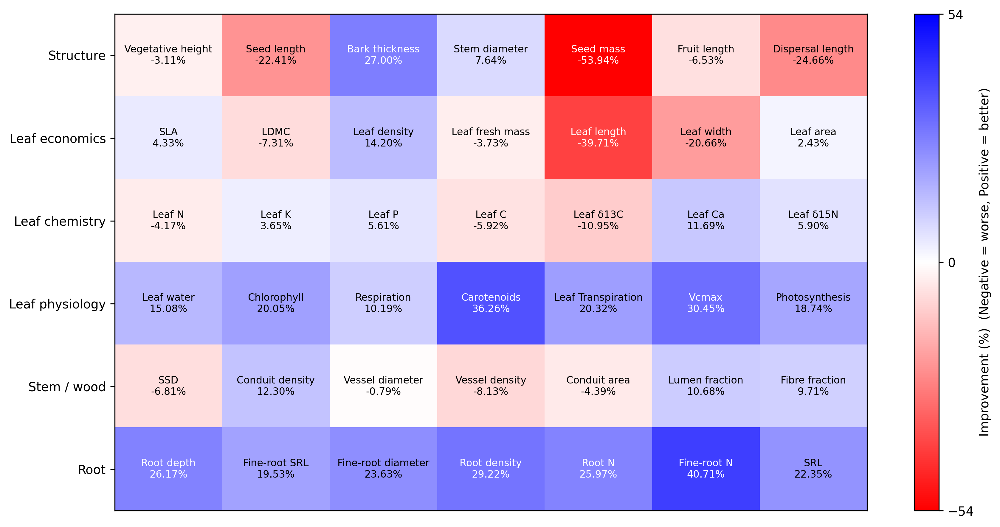

Matrix 1 (RMSE) - model: MICE


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,0.2502,0.1627,0.2461,0.2015,0.2025,0.2452,0.1548
Leaf economics,0.2069,0.1734,0.1707,0.1924,0.2097,0.2441,0.2156
Leaf chemistry,0.2171,0.2117,0.2213,0.2012,0.2030,0.2606,0.2018
Leaf physiology,0.1302,0.2099,0.1974,0.1549,0.2517,0.2191,0.1756
Stem / wood,0.1742,0.2191,0.2919,0.4052,0.2063,0.2186,0.1860
Root,0.2097,0.2445,0.2485,0.2973,0.2376,0.2682,0.2353


Matrix 2 (RMSE) - model: BHPMF_embs


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,0.1361,0.1228,0.1500,0.1431,0.1505,0.1507,0.1094
Leaf economics,0.1509,0.1187,0.1224,0.1364,0.1334,0.1605,0.1408
Leaf chemistry,0.1520,0.1518,0.1509,0.1440,0.1483,0.1782,0.1431
Leaf physiology,0.0982,0.1498,0.1561,0.1090,0.1790,0.1647,0.1256
Stem / wood,0.1152,0.1602,0.2026,0.2949,0.1424,0.1656,0.1386
Root,0.1580,0.1885,0.1761,0.1724,0.1873,0.1942,0.1486


Improvement % (positive = better, RMSE down): BHPMF_embs vs MICE


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,45.60,24.53,39.04,29.02,25.65,38.56,29.32
Leaf economics,27.08,31.53,28.32,29.12,36.41,34.24,34.70
Leaf chemistry,30.02,28.31,31.84,28.42,26.95,31.62,29.10
Leaf physiology,24.62,28.62,20.94,29.60,28.90,24.84,28.50
Stem / wood,33.88,26.90,30.60,27.23,30.98,24.25,25.47
Root,24.66,22.90,29.14,42.02,21.18,27.60,36.84


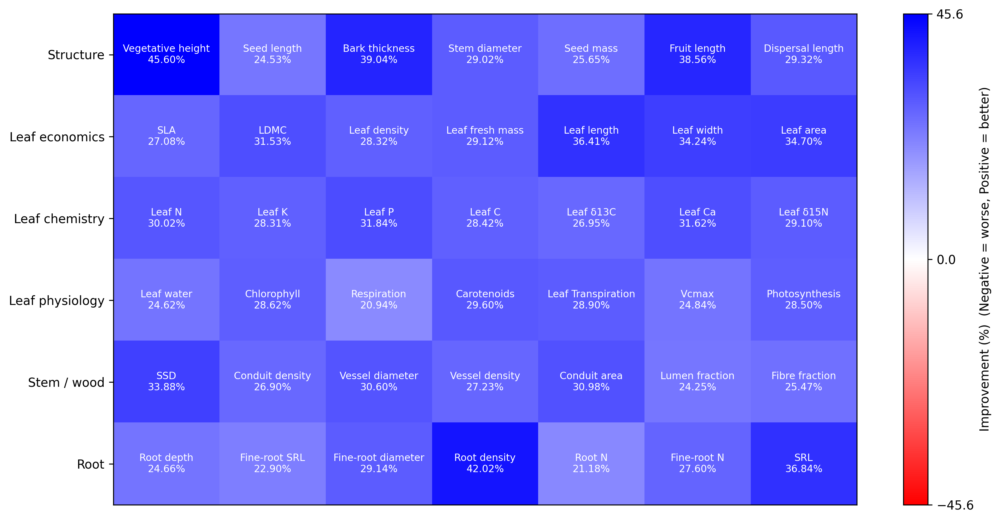

Matrix 1 (RMSE) - model: BHPMF_traits


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,0.1520,0.1166,0.1575,0.1498,0.1534,0.1567,0.1077
Leaf economics,0.1514,0.1239,0.1248,0.1311,0.1235,0.1366,0.1358
Leaf chemistry,0.1594,0.1547,0.1593,0.1442,0.1536,0.1802,0.1480
Leaf physiology,0.1042,0.1493,0.1579,0.1083,0.1920,0.1612,0.1288
Stem / wood,0.1242,0.1643,0.2036,0.2982,0.1495,0.1724,0.1446
Root,0.1582,0.1823,0.1855,0.1812,0.1854,0.2049,0.1576


Matrix 2 (RMSE) - model: BHPMF_embs


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,0.1361,0.1228,0.1500,0.1431,0.1505,0.1507,0.1094
Leaf economics,0.1509,0.1187,0.1224,0.1364,0.1334,0.1605,0.1408
Leaf chemistry,0.1520,0.1518,0.1509,0.1440,0.1483,0.1782,0.1431
Leaf physiology,0.0982,0.1498,0.1561,0.1090,0.1790,0.1647,0.1256
Stem / wood,0.1152,0.1602,0.2026,0.2949,0.1424,0.1656,0.1386
Root,0.1580,0.1885,0.1761,0.1724,0.1873,0.1942,0.1486


Improvement % (positive = better, RMSE down): BHPMF_embs vs BHPMF_traits


,slot_1,slot_2,slot_3,slot_4,slot_5,slot_6,slot_7
Structure,10.48,-5.31,4.76,4.53,1.84,3.86,-1.63
Leaf economics,0.38,4.21,1.91,-4.04,-8.00,-17.56,-3.68
Leaf chemistry,4.67,1.87,5.27,0.12,3.44,1.12,3.36
Leaf physiology,5.76,-0.34,1.20,-0.70,6.77,-2.16,2.52
Stem / wood,7.24,2.49,0.48,1.12,4.75,3.92,4.11
Root,0.12,-3.42,5.07,4.88,-1.00,5.21,5.71


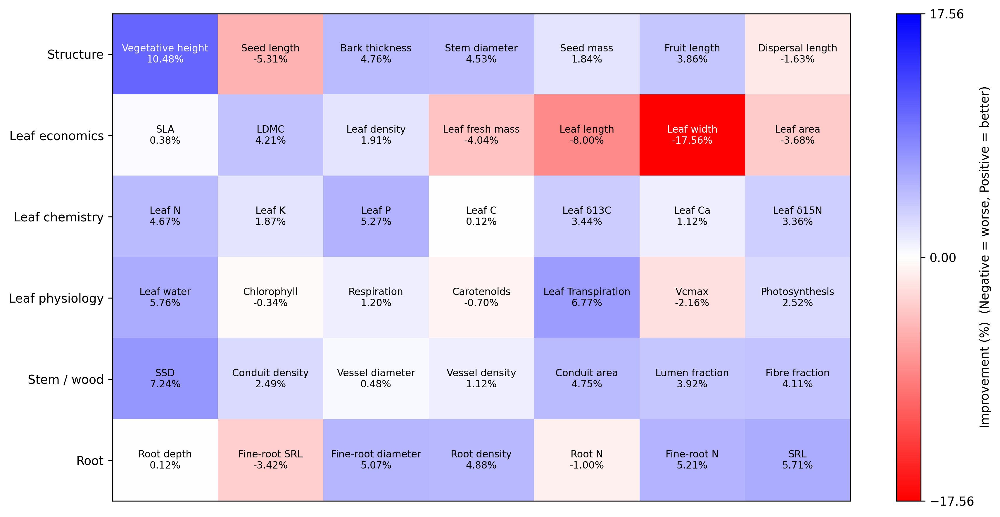

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import TwoSlopeNorm

#Pairwise model improvement heatmaps
# ========= Existing inputs =========
# layout = [7, 7, 7, 7, 7, 7]
# row_titles = [...]
# tables_dict = {"model_1": df1, "model_2": df2, ...}


def get_rmse(tbl, tr):
    s = tbl.loc[tbl['name'] == tr, 'mse_norm']

    if s.empty:
        raise KeyError(f"Trait '{tr}' not found in model table.")

    v = float(s.values[0])

    if v < 0:
        raise ValueError(f"mse_norm < 0 for trait '{tr}' (value={v})")

    return v


def build_trait_matrices(tbl1, tbl2, layout, row_titles):
    traits = tbl1['name'].tolist()
    n_traits = len(traits)

    total_rows = len(layout)

    if len(row_titles) < total_rows:
        row_titles = list(row_titles) + [
            f"Row {i + 1}" for i in range(len(row_titles), total_rows)
        ]

    max_cols = max(layout)
    col_slots = [f"slot_{i + 1}" for i in range(max_cols)]

    m1_mat = pd.DataFrame(np.nan, index=row_titles[:total_rows], columns=col_slots)
    m2_mat = pd.DataFrame(np.nan, index=row_titles[:total_rows], columns=col_slots)
    trait_name_mat = pd.DataFrame("", index=row_titles[:total_rows], columns=col_slots)

    trait_index = 0

    for r in range(total_rows):
        n_in_row = layout[r]
        row_trait_list = traits[trait_index:min(trait_index + n_in_row, n_traits)]

        if not row_trait_list:
            break

        cat = row_titles[r]

        for j, tr in enumerate(row_trait_list):
            slot = col_slots[j]
            trait_name_mat.loc[cat, slot] = tr
            m1_mat.loc[cat, slot] = get_rmse(tbl1, tr)
            m2_mat.loc[cat, slot] = get_rmse(tbl2, tr)

        trait_index += len(row_trait_list)

        if trait_index >= n_traits:
            break

    return m1_mat, m2_mat, trait_name_mat


def plot_improvement_heatmap(tables_dict, base_idx, compare_idx, layout, row_titles):
    model_names = list(tables_dict.keys())

    if max(base_idx, compare_idx) >= len(model_names):
        raise ValueError("Model index is out of range.")

    m1_name = model_names[base_idx]
    m2_name = model_names[compare_idx]

    tbl1 = tables_dict[m1_name]
    tbl2 = tables_dict[m2_name]

    m1_mat, m2_mat, trait_name_mat = build_trait_matrices(
        tbl1,
        tbl2,
        layout,
        row_titles
    )

    # Improvement percentage: positive means the compared model has lower RMSE
    eps = 1e-12
    improve_pct = (m1_mat - m2_mat) / (m1_mat + eps) * 100.0

    # Remove fully empty rows
    valid_row_mask = (trait_name_mat.values != "").any(axis=1)

    m1_values = m1_mat.loc[valid_row_mask].round(4)
    m2_values = m2_mat.loc[valid_row_mask].round(4)
    improve_values = improve_pct.loc[valid_row_mask].round(2)
    trait_name_mat2 = trait_name_mat.loc[valid_row_mask]

    print(f"Matrix 1 (RMSE) - model: {m1_name}")
    display(m1_values)

    print(f"Matrix 2 (RMSE) - model: {m2_name}")
    display(m2_values)

    print(f"Improvement % (positive = better, RMSE down): {m2_name} vs {m1_name}")
    display(improve_values)

    # Plot heatmap
    fig, ax = plt.subplots(figsize=(12, 6), dpi=300)

    vals = improve_values.values.astype(float)
    vmax = np.nanmax(np.abs(vals))

    norm = TwoSlopeNorm(vmin=-vmax, vcenter=0, vmax=vmax)
    im = ax.imshow(vals, aspect='auto', cmap='bwr_r', norm=norm)

    ax.xaxis.set_visible(False)
    ax.set_yticks(np.arange(len(improve_values.index)))
    ax.set_yticklabels(improve_values.index)

    cbar = plt.colorbar(im, ax=ax)
    cbar.set_label("Improvement (%)  (Negative = worse, Positive = better)")
    cbar.set_ticks(np.array([-vmax, 0, vmax]))

    def pick_text_color(rgba):
        r, g, b, a = rgba
        luminance = 0.299 * r + 0.587 * g + 0.114 * b
        return "black" if luminance > 0.6 else "white"

    for i in range(improve_values.shape[0]):
        for j in range(improve_values.shape[1]):
            tr = trait_name_mat2.iat[i, j]
            val = improve_values.iat[i, j]

            if tr == "" or pd.isna(val):
                continue

            rgba = im.cmap(im.norm(val))
            color = pick_text_color(rgba)

            ax.text(
                j,
                i,
                f"{tr}\n{val:.2f}%",
                ha='center',
                va='center',
                fontsize=8,
                color=color
            )

    plt.tight_layout()
    plt.show()


# Generate three comparison heatmaps:
# model 3 vs model 0, model 2 vs model 0, and model 1 vs model 0
for base_idx, compare_idx in [(3, 0), (2, 0), (1, 0)]:
    plot_improvement_heatmap(
        tables_dict=tables_dict,
        base_idx=base_idx,
        compare_idx=compare_idx,
        layout=layout,
        row_titles=row_titles
    )

In [9]:
#Trait-level RMSE across different models
emb_df['model'] = 'EBPMF_emb'
bhpmfr_df['model'] = 'BHPMF(R)'
mice_df['model'] = 'MICE'
flora_df['model'] = 'EBPMF_traits'

# Use the trait order from emb_df as the reference order
name_order = emb_df['name'].tolist()

all_traits_df = pd.concat(
    [emb_df, flora_df, bhpmfr_df, mice_df],
    axis=0,
    ignore_index=True
)

all_traits_df = all_traits_df[
    ['name', 'model', 'pearson_r', 'mse', 'mse_norm', 'len']
]

# Set trait names as an ordered categorical variable
all_traits_df['name'] = pd.Categorical(
    all_traits_df['name'],
    categories=name_order,
    ordered=True
)

# Sort by trait name and model
all_traits_df = all_traits_df.sort_values(
    ['name', 'model']
).reset_index(drop=True)

# Create a trait-by-model table for normalized RMSE
trait_model_mse_norm = all_traits_df.pivot(
    index='name',
    columns='model',
    values='mse_norm'
).reindex(name_order).reset_index()

# Create a trait-by-model table for Pearson correlation
trait_model_r = all_traits_df.pivot(
    index='name',
    columns='model',
    values='pearson_r'
).reindex(name_order).reset_index()


In [10]:

trait_model_mse_norm



model,name,BHPMF(R),EBPMF_emb,EBPMF_traits,MICE
0,Vegetative height,0.132000,0.136101,0.152033,0.250193
1,Seed length,0.100325,0.122810,0.116622,0.162731
2,Bark thickness,0.205514,0.150017,0.157522,0.246110
3,Stem diameter,0.154891,0.143057,0.149837,0.201535
4,Seed mass,0.097784,0.150528,0.153354,0.202462
5,Fruit length,0.141443,0.150675,0.156720,0.245241
6,Dispersal length,0.087782,0.109428,0.107675,0.154821
7,SLA,0.157679,0.150854,0.151432,0.206871
8,LDMC,0.110634,0.118720,0.123933,0.173399
9,Leaf density,0.142633,0.122375,0.124764,0.170723


In [11]:
trait_model_r

model,name,BHPMF(R),EBPMF_emb,EBPMF_traits,MICE
0,Vegetative height,0.852688,0.835806,0.789554,0.446099
1,Seed length,0.884995,0.823010,0.842400,0.705675
2,Bark thickness,0.558586,0.722700,0.687972,0.410032
3,Stem diameter,0.653649,0.685025,0.647899,0.449564
4,Seed mass,0.876744,0.603028,0.582504,0.252320
5,Fruit length,0.704650,0.594185,0.549002,0.137761
6,Dispersal length,0.900432,0.840721,0.847168,0.693809
7,SLA,0.540905,0.549491,0.536444,0.344715
8,LDMC,0.783454,0.737784,0.709863,0.521019
9,Leaf density,0.400043,0.505728,0.476539,0.221533


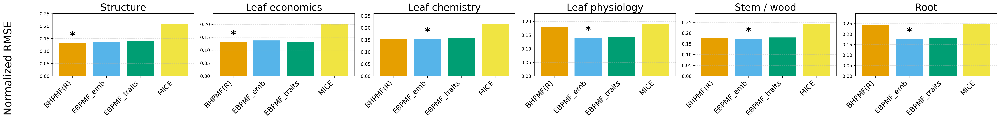


Overall normalized RMSE:
          model      mean
0      BHPMF(R)  0.169503
1     EBPMF_emb  0.152870
2  EBPMF_traits  0.155560
3          MICE  0.218428


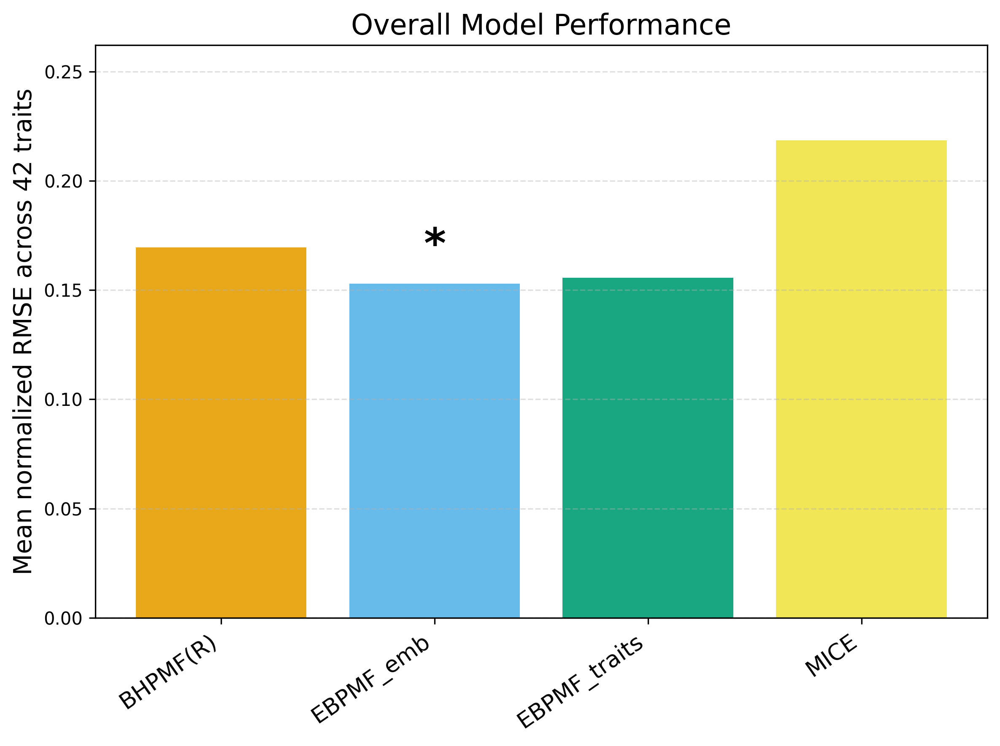

In [12]:

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# ===============================
# 0. Basic settings
# ===============================

df = trait_model_mse_norm.copy()

# Model columns, excluding the trait-name column
model_cols = [c for c in df.columns if c != 'name']

row_titles = [
    'Structure',
    'Leaf economics',
    'Leaf chemistry',
    'Leaf physiology',
    'Stem / wood',
    'Root'
]

colors = [
    '#E69F00',
    '#56B4E9',
    '#009E73',
    '#F0E442',
    '#0072B2',
    '#D55E00',
    '#CC79A7'
]

traits = df['name'].tolist()
n_traits = len(traits)

# Number of traits in each group
layout = [7, 7, 7, 7, 7, 7]
total_rows = len(layout)

if len(row_titles) < total_rows:
    row_titles = list(row_titles) + [
        f"Row {i + 1}" for i in range(len(row_titles), total_rows)
    ]

x = np.arange(len(model_cols))


# ===============================
# Helper function:
# mark the bar(s) with the lowest RMSE
# ===============================

def mark_lowest_bar(ax, values, x_positions):
    values = np.asarray(values, dtype=float)

    # Do nothing if all values are missing
    if np.all(np.isnan(values)):
        return

    min_val = np.nanmin(values)

    # Mark all bars in case of tied minimum values
    lowest_indices = np.where(
        np.isclose(values, min_val, equal_nan=False)
    )[0]

    ymin, ymax = ax.get_ylim()
    offset = (ymax - ymin) * 0.03

    for i in lowest_indices:
        ax.text(
            x_positions[i],
            values[i] + offset,
            '*',
            ha='center',
            va='bottom',
            fontsize=24,
            fontweight='bold'
        )


# ===============================
# 1. Organize traits by group
# ===============================

rows_traits = []
trait_index = 0

for row in range(total_rows):
    n_in_row = layout[row]
    row_traits = traits[
        trait_index:min(trait_index + n_in_row, n_traits)
    ]
    rows_traits.append(row_traits)

    trait_index += len(row_traits)

    if trait_index >= n_traits:
        for _ in range(row + 1, total_rows):
            rows_traits.append([])
        break


# ===============================
# 2. Group-level mean panels
# ===============================

fig1, axes1 = plt.subplots(
    1,
    total_rows,
    figsize=(5.2 * total_rows, 5.2),
    dpi=300
)

if total_rows == 1:
    axes1 = [axes1]

for row in range(total_rows):
    ax = axes1[row]
    row_traits = rows_traits[row]

    if len(row_traits) > 0:
        subdf = df[df['name'].isin(row_traits)].copy()

        # Preserve the original trait order within each group
        subdf['name'] = pd.Categorical(
            subdf['name'],
            categories=row_traits,
            ordered=True
        )
        subdf = subdf.sort_values('name')

        # Mean normalized RMSE for each model within this group
        mean_vals = subdf[model_cols].mean(
            axis=0,
            skipna=True
        ).values
    else:
        mean_vals = np.full(len(model_cols), np.nan)

    ax.bar(
        x,
        mean_vals,
        color=colors[:len(model_cols)]
    )

    ax.set_xticks(x)
    ax.set_xticklabels(
        model_cols,
        rotation=45,
        ha='right',
        fontsize=16
    )

    ax.set_title(
        str(row_titles[row]),
        fontsize=22
    )

    ymax = (
        np.nanmax(mean_vals) * 1.2
        if np.any(~np.isnan(mean_vals))
        else 1
    )

    ax.set_ylim(0, ymax)

    # Add asterisks above the lowest RMSE bar(s)
    mark_lowest_bar(ax, mean_vals, x)

    ax.grid(
        axis='y',
        linestyle='--',
        alpha=0.4
    )

fig1.supylabel(
    "Normalized RMSE",
    fontsize=24,
    x=0.005
)

fig1.tight_layout(
    rect=[0.02, 0.18, 1, 0.92]
)

plt.show()


# ===============================
# 3. Trait-level panels
# ===============================

max_cols = max(layout)

fig2, axes2 = plt.subplots(
    total_rows,
    max_cols,
    figsize=(4.2 * max_cols, 3.9 * total_rows),
    dpi=300
)

if total_rows == 1:
    axes2 = np.array([axes2])

if max_cols == 1:
    axes2 = axes2[:, np.newaxis]

for row in range(total_rows):
    row_traits = rows_traits[row]

    for col in range(max_cols):
        ax = axes2[row, col]

        if col < len(row_traits):
            trait = row_traits[col]
            row_data = df[df['name'] == trait]

            if len(row_data) > 0:
                rmse_vals = (
                    row_data[model_cols]
                    .iloc[0]
                    .values
                    .astype(float)
                )
            else:
                rmse_vals = np.full(
                    len(model_cols),
                    np.nan
                )

            ax.bar(
                x,
                rmse_vals,
                color=colors[:len(model_cols)]
            )

            ax.set_xticks(x)

            if row == total_rows - 1:
                ax.set_xticklabels(
                    model_cols,
                    rotation=45,
                    ha='right',
                    fontsize=14
                )
            else:
                ax.set_xticklabels([])

            ax.set_title(
                trait,
                fontsize=18
            )

            valid_vals = [
                v for v in rmse_vals
                if not np.isnan(v)
            ]

            ymax = (
                max(valid_vals) * 1.2
                if len(valid_vals) > 0
                else 1
            )

            ax.set_ylim(0, ymax)

            # Add asterisks above the lowest RMSE bar(s)
            mark_lowest_bar(ax, rmse_vals, x)

            ax.grid(
                axis='y',
                linestyle='--',
                alpha=0.4
            )

        else:
            ax.axis('off')

fig2.supylabel(
    "Normalized RMSE",
    fontsize=24,
    x=0.005
)

fig2.tight_layout(
    rect=[0.02, 0.08, 1, 0.96]
)

plt.show()


# ===============================
# 4. Overall performance summary
# ===============================

overall_stats = pd.DataFrame({
    'model': model_cols,
    'mean': df[model_cols].mean(
        axis=0,
        skipna=True
    ).values
})

print("\nOverall normalized RMSE:")
print(overall_stats)


# ===============================
# 5. Overall performance bar plot
# ===============================

models = overall_stats['model'].tolist()
means = overall_stats['mean'].values

x = np.arange(len(models))

fig3, ax3 = plt.subplots(
    figsize=(8, 6),
    dpi=300
)

ax3.bar(
    x,
    means,
    color=colors[:len(models)],
    alpha=0.9
)

ax3.set_xticks(x)
ax3.set_xticklabels(
    models,
    rotation=35,
    ha='right',
    fontsize=13
)

ax3.set_ylabel(
    "Mean normalized RMSE across 42 traits",
    fontsize=14
)

ax3.set_title(
    "Overall Model Performance",
    fontsize=16
)

valid_means = [
    value for value in means
    if not np.isnan(value)
]

overall_ymax = (
    max(valid_means) * 1.2
    if len(valid_means) > 0
    else 1
)

ax3.set_ylim(0, overall_ymax)

# Add asterisks above the lowest RMSE bar(s)
mark_lowest_bar(ax3, means, x)

ax3.grid(
    axis='y',
    linestyle='--',
    alpha=0.4
)

fig3.tight_layout()
plt.show()



C:\Users\cml\AppData\Local\Temp\ipykernel_6248\2293496528.py:345: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig1.tight_layout(


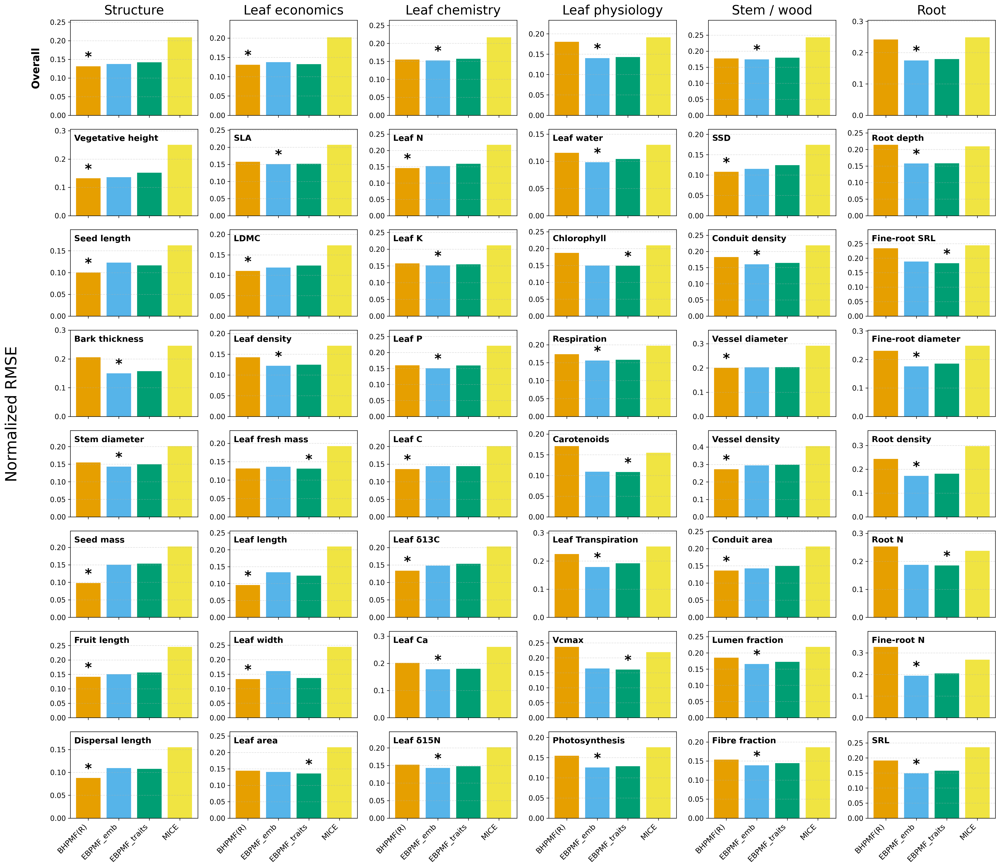


Overall normalized RMSE:
          model      mean
0      BHPMF(R)  0.169503
1     EBPMF_emb  0.152870
2  EBPMF_traits  0.155560
3          MICE  0.218428


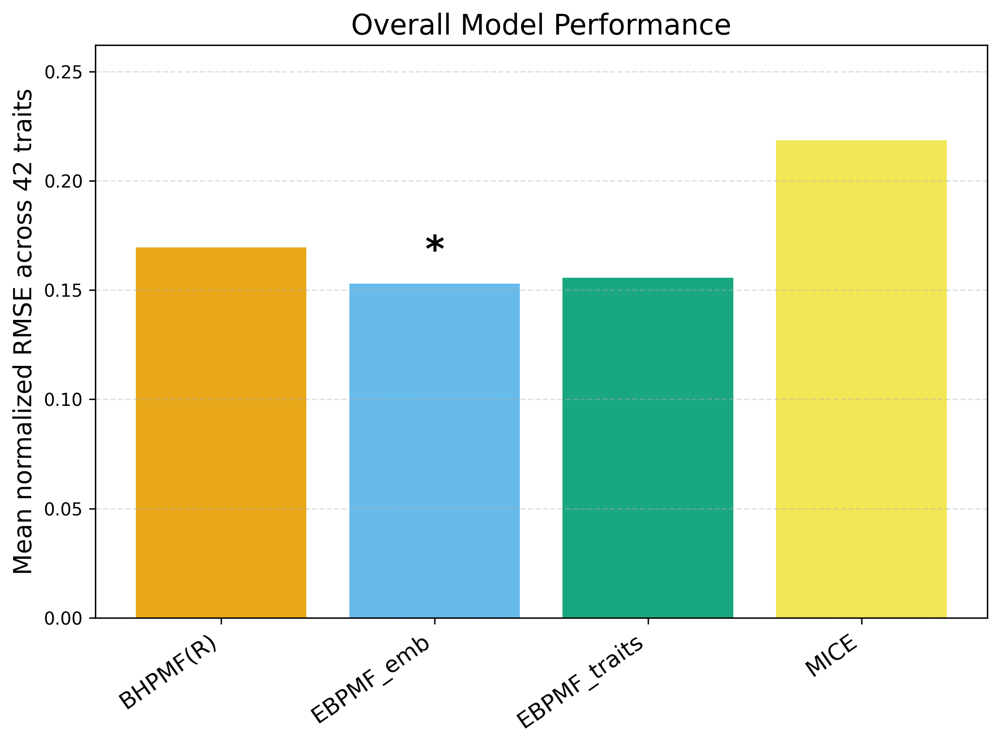

In [13]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd


# ===============================
# 0. Basic settings
# ===============================

df = trait_model_mse_norm.copy()

# Model columns, excluding the trait-name column
model_cols = [c for c in df.columns if c != 'name']

group_titles = [
    'Structure',
    'Leaf economics',
    'Leaf chemistry',
    'Leaf physiology',
    'Stem / wood',
    'Root'
]

colors = [
    '#E69F00',
    '#56B4E9',
    '#009E73',
    '#F0E442',
    '#0072B2',
    '#D55E00',
    '#CC79A7'
]

traits = df['name'].tolist()
n_traits = len(traits)

# Number of traits in each group
layout = [7, 7, 7, 7, 7, 7]

n_groups = len(layout)
max_traits_per_group = max(layout)

if len(group_titles) < n_groups:
    group_titles = list(group_titles) + [
        f"Group {i + 1}"
        for i in range(len(group_titles), n_groups)
    ]

x = np.arange(len(model_cols))


# ===============================
# Helper function:
# mark the bar(s) with the lowest RMSE
# ===============================

def mark_lowest_bar(ax, values, x_positions):
    values = np.asarray(values, dtype=float)

    if np.all(np.isnan(values)):
        return

    min_val = np.nanmin(values)

    lowest_indices = np.where(
        np.isclose(values, min_val, equal_nan=False)
    )[0]

    ymin, ymax = ax.get_ylim()
    offset = (ymax - ymin) * 0.025

    for i in lowest_indices:
        ax.text(
            x_positions[i],
            values[i] + offset,
            '*',
            ha='center',
            va='bottom',
            fontsize=21,
            fontweight='bold'
        )


# ===============================
# Helper function:
# standard bar-panel formatting
# ===============================

def format_bar_panel(
    ax,
    values,
    show_xticklabels=False,
    title=None,
    panel_label=None,
    title_fontsize=20
):
    values = np.asarray(values, dtype=float)

    ax.bar(
        x,
        values,
        color=colors[:len(model_cols)]
    )

    ax.set_xticks(x)

    if show_xticklabels:
        ax.set_xticklabels(
            model_cols,
            rotation=45,
            ha='right',
            fontsize=12
        )
    else:
        ax.set_xticklabels([])

    # Column titles appear only in the first row
    if title is not None:
        ax.set_title(
            title,
            fontsize=title_fontsize,
            pad=9
        )

    # Trait names are shown inside each panel
    if panel_label is not None:
        ax.text(
            0.03,
            0.94,
            panel_label,
            transform=ax.transAxes,
            ha='left',
            va='top',
            fontsize=13,
            fontweight='bold'
        )

    valid_values = values[~np.isnan(values)]

    ymax = (
        np.max(valid_values) * 1.22
        if len(valid_values) > 0
        else 1
    )

    ax.set_ylim(0, ymax)

    mark_lowest_bar(
        ax,
        values,
        x
    )

    ax.grid(
        axis='y',
        linestyle='--',
        alpha=0.4
    )

    ax.tick_params(
        axis='y',
        labelsize=11
    )


# ===============================
# 1. Organize traits by group
# ===============================

grouped_traits = []

trait_index = 0

for group_size in layout:
    group_traits = traits[
        trait_index:
        min(trait_index + group_size, n_traits)
    ]

    grouped_traits.append(group_traits)
    trait_index += group_size


# ===============================
# 2. Combined figure
#
# First row: group means
# Remaining rows: individual traits
# ===============================

n_plot_rows = max_traits_per_group + 1

height_ratios = [1.1] + [1] * max_traits_per_group

fig1, axes = plt.subplots(
    n_plot_rows,
    n_groups,
    figsize=(
        4.3 * n_groups,
        2.8 * n_plot_rows
    ),
    dpi=300,
    gridspec_kw={
        'height_ratios': height_ratios,

        # Smaller vertical spacing between rows
        'hspace': 0.16,

        'wspace': 0.25
    }
)

axes = np.asarray(axes)

if axes.ndim == 1:
    axes = axes.reshape(
        n_plot_rows,
        n_groups
    )


# ===============================
# 2.1 First row: group means
# ===============================

for group_index in range(n_groups):
    ax = axes[0, group_index]

    group_traits = grouped_traits[group_index]

    if len(group_traits) > 0:
        subdf = df[
            df['name'].isin(group_traits)
        ].copy()

        subdf['name'] = pd.Categorical(
            subdf['name'],
            categories=group_traits,
            ordered=True
        )

        subdf = subdf.sort_values('name')

        mean_values = (
            subdf[model_cols]
            .mean(axis=0, skipna=True)
            .values
            .astype(float)
        )

    else:
        mean_values = np.full(
            len(model_cols),
            np.nan
        )

    format_bar_panel(
        ax=ax,
        values=mean_values,
        show_xticklabels=False,
        title=group_titles[group_index],

        # Do not repeat "Overall" inside every panel
        panel_label=None,

        title_fontsize=20
    )


# Add "Overall" to the left side of the first row
axes[0, 0].text(
    -0.27,
    0.5,
    'Overall',
    transform=axes[0, 0].transAxes,
    rotation=90,
    ha='center',
    va='center',
    fontsize=16,
    fontweight='bold'
)


# ===============================
# 2.2 Remaining rows:
# individual traits
# ===============================

for group_index in range(n_groups):
    group_traits = grouped_traits[group_index]

    for trait_position in range(max_traits_per_group):
        ax = axes[
            trait_position + 1,
            group_index
        ]

        if trait_position < len(group_traits):
            trait = group_traits[trait_position]

            row_data = df[
                df['name'] == trait
            ]

            if len(row_data) > 0:
                rmse_values = (
                    row_data[model_cols]
                    .iloc[0]
                    .values
                    .astype(float)
                )
            else:
                rmse_values = np.full(
                    len(model_cols),
                    np.nan
                )

            show_model_names = (
                trait_position ==
                len(group_traits) - 1
            )

            format_bar_panel(
                ax=ax,
                values=rmse_values,
                show_xticklabels=show_model_names,
                title=None,
                panel_label=trait
            )

        else:
            ax.axis('off')


# ===============================
# 3. Shared labels and layout
# ===============================

fig1.supylabel(
    "Normalized RMSE",
    fontsize=24,
    x=0.07
)

fig1.tight_layout(
    rect=[0.035, 0.025, 1, 0.985]
)

plt.show()


# ===============================
# 4. Overall performance summary
# ===============================

overall_stats = pd.DataFrame({
    'model': model_cols,
    'mean': df[model_cols].mean(
        axis=0,
        skipna=True
    ).values
})

print("\nOverall normalized RMSE:")
print(overall_stats)


# ===============================
# 5. Overall performance bar plot
# ===============================

models = overall_stats['model'].tolist()
means = overall_stats['mean'].values

x_overall = np.arange(len(models))

fig2, ax2 = plt.subplots(
    figsize=(8, 6),
    dpi=300
)

ax2.bar(
    x_overall,
    means,
    color=colors[:len(models)],
    alpha=0.9
)

ax2.set_xticks(x_overall)

ax2.set_xticklabels(
    models,
    rotation=35,
    ha='right',
    fontsize=13
)

ax2.set_ylabel(
    "Mean normalized RMSE across 42 traits",
    fontsize=14
)

ax2.set_title(
    "Overall Model Performance",
    fontsize=16
)

valid_means = means[~np.isnan(means)]

overall_ymax = (
    np.max(valid_means) * 1.2
    if len(valid_means) > 0
    else 1
)

ax2.set_ylim(
    0,
    overall_ymax
)

mark_lowest_bar(
    ax2,
    means,
    x_overall
)

ax2.grid(
    axis='y',
    linestyle='--',
    alpha=0.4
)

fig2.tight_layout()

plt.show()

In [15]:
# =============================================================================
# Load the learned latent matrices, with integrity checks.
#
# The 0706 export mislabelled the two models: V_emb/W_emb and V_flora/W_flora were
# byte-identical, and both were in fact the FLORA model. The assertions below make
# that failure mode impossible to repeat silently.
#   EBPMF_emb   -> W has n_emb_pcs (=48) columns
#   EBPMF_flora -> W has len(flora_feat_cols) (=28) columns
# =============================================================================

import numpy as np
import hashlib

N_EMB_PCS = 48   # embedding PCs used as species-level prior input

def _md5(path):
    return hashlib.md5(open(path, 'rb').read()).hexdigest()

V_emb   = np.load('outputs/V_emb_0706.npy')
W_emb   = np.load('outputs/W_emb_0706.npy')

n_traits = len(names)

n_latent = V_emb.shape[1]
print(f"V_emb   {V_emb.shape}   W_emb   {W_emb.shape}")



V_emb   (42, 24)   W_emb   (24, 48)


## Projection figures

Migrated from `EBPMF_projection-0617_revised.ipynb`, which is the reference for these
figures. Both notebooks call the same functions in `ebpmf_projection_viz.py`, so the
output is identical. That notebook now only trains the models and saves `V` and `W`.

`importance_barplot` takes column means of `|V W|` -- influence exerted by each predictor.
`received_influence_barplot` takes row means -- influence received by each target trait.
These are the two different bar plots described in the Fig. 5 and Fig. 6 captions.

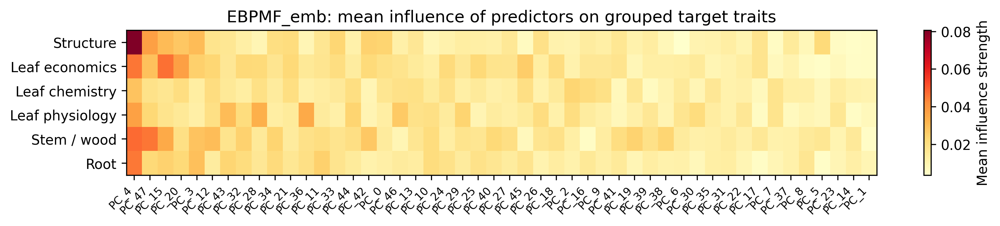

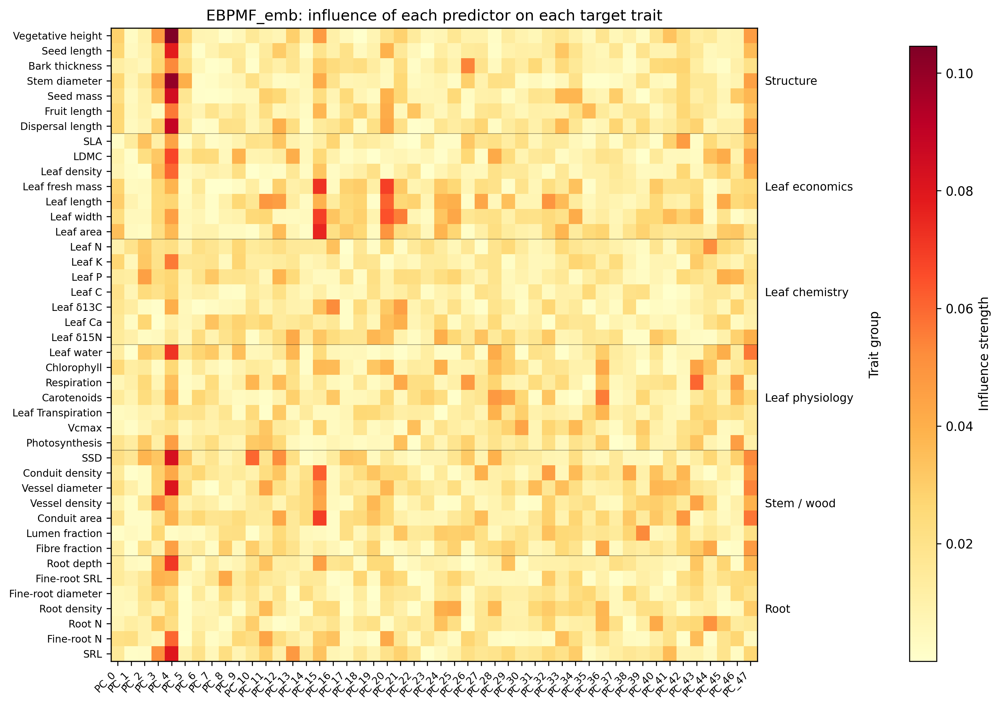

EBPMF_emb: predictors ranked by mean absolute influence
  1. PC_4                             0.0473    6.1%   cum   6.1%
  2. PC_47                            0.0291    3.8%   cum   9.9%
  3. PC_15                            0.0283    3.7%   cum  13.5%
  4. PC_20                            0.0236    3.0%   cum  16.6%
  5. PC_3                             0.0228    2.9%   cum  19.5%
  6. PC_12                            0.0206    2.7%   cum  22.2%
  7. PC_43                            0.0197    2.5%   cum  24.7%
  8. PC_32                            0.0189    2.4%   cum  27.1%
  9. PC_28                            0.0189    2.4%   cum  29.6%
 10. PC_34                            0.0182    2.3%   cum  31.9%
 11. PC_21                            0.018    2.3%   cum  34.2%
 12. PC_36                            0.0179    2.3%   cum  36.5%
 13. PC_11                            0.0177    2.3%   cum  38.8%
 14. PC_33                            0.0174    2.3%   cum  41.1%
 15. PC_44           

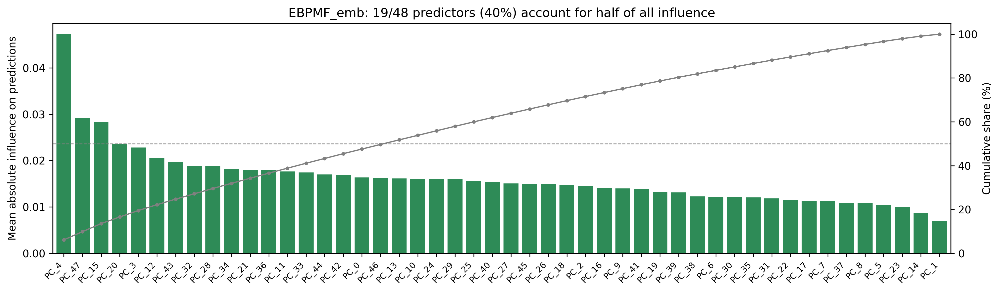

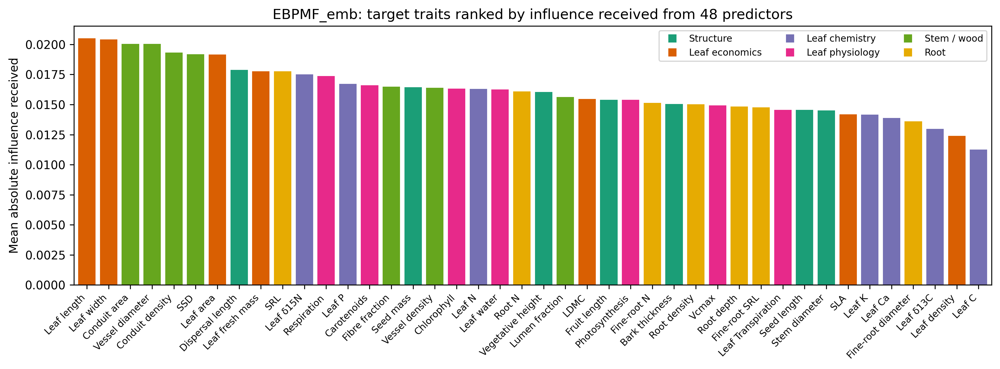

(array(['Leaf length', 'Leaf width', 'Conduit area', 'Vessel diameter',
        'Conduit density', 'SSD', 'Leaf area', 'Dispersal length',
        'Leaf fresh mass', 'SRL', 'Leaf δ15N', 'Respiration', 'Leaf P',
        'Carotenoids', 'Fibre fraction', 'Seed mass', 'Vessel density',
        'Chlorophyll', 'Leaf N', 'Leaf water', 'Root N',
        'Vegetative height', 'Lumen fraction', 'LDMC', 'Fruit length',
        'Photosynthesis', 'Fine-root N', 'Bark thickness', 'Root density',
        'Vcmax', 'Root depth', 'Fine-root SRL', 'Leaf Transpiration',
        'Seed length', 'Stem diameter', 'SLA', 'Leaf K', 'Leaf Ca',
        'Fine-root diameter', 'Leaf δ13C', 'Leaf density', 'Leaf C'],
       dtype='<U18'),
 array([0.02050666, 0.02041713, 0.02004403, 0.02003275, 0.01932849,
        0.01919149, 0.01915545, 0.01787359, 0.01776348, 0.01776189,
        0.01750707, 0.01735947, 0.01672167, 0.0166096 , 0.01649735,
        0.01645013, 0.01638471, 0.01633455, 0.0162965 , 0.01625428,
        0.01

In [16]:
# =============================================================================
# Projection figures, both models. Reference implementation: ebpmf_projection_viz.py
# =============================================================================
from python.ebpmf_projection_viz import (influence_summary, grouped_influence_heatmap,
                                  full_influence_heatmap, importance_barplot,
                                  received_influence_barplot, ROW_TITLES, LAYOUT)

row_titles, layout = ROW_TITLES, LAYOUT
emb_pc_names     = [f'PC_{i}' for i in range(N_EMB_PCS)]

# ---- embedding ----
I_emb, sorted_names_emb, sorted_importance_emb, order_emb = influence_summary(
    V_emb, W_emb, emb_pc_names, model='EBPMF_emb')
grouped_influence_heatmap(I_emb, emb_pc_names, 'EBPMF_emb', order=order_emb, figsize=(11, 2.4))
full_influence_heatmap(I_emb, emb_pc_names, list(names), 'EBPMF_emb')
importance_barplot(sorted_names_emb, sorted_importance_emb, 'EBPMF_emb',
                   color='seagreen', print_top=15)
received_influence_barplot(I_emb, list(names), 'EBPMF_emb')


## RQ2 — sparsity and taxonomic conservatism


In [17]:
# =============================================================================
# Taxonomic signal per trait  (third H2 mechanism; Peter comment #121)
#
# This is deliberately NOT derived from the embeddings
# descriptions. It is an intrinsic property of each trait, computed from the
# observed TRY values and the taxonomy: the proportion of variance attributable
# to family and genus in a nested random-effects decomposition
#
#     y_ij ~ (1 | family / genus)
#
# Only in this form is it independent of the two floristic representations, and
# only then can it serve as a covariate explaining why embeddings improve on
# BHPMF(R) -- whose prior IS the taxonomy -- for some traits and not others.
#
# Variance components use the unbalanced-design expected-mean-square
# coefficients (Searle, Casella & McCulloch 1992), since family and genus sizes
# are strongly unequal.
# =============================================================================

def taxonomic_signal(trait_matrix, taxa_info, names, min_obs=30, min_group=3):
    M = np.asarray(trait_matrix, dtype=float)
    fam_all = taxa_info['family'].astype(str).values
    gen_all = (taxa_info['family'].astype(str) + '|' + taxa_info['genus'].astype(str)).values

    rows = []
    for j, nm in enumerate(names):
        y = M[:, j]
        ok = np.isfinite(y)
        if ok.sum() < min_obs:
            rows.append([nm, np.nan, np.nan, np.nan, np.nan, int(ok.sum())]); continue

        yj, fj, gj = y[ok], fam_all[ok], gen_all[ok]
        cnt = pd.Series(gj).value_counts()
        keep = np.isin(gj, cnt[cnt >= min_group].index)
        if keep.sum() < min_obs or pd.Series(fj[keep]).nunique() < 2:
            rows.append([nm, np.nan, np.nan, np.nan, np.nan, int(ok.sum())]); continue
        yj, fj, gj = yj[keep], fj[keep], gj[keep]

        df = pd.DataFrame({'y': yj, 'fam': fj, 'gen': gj})
        N, a, b = len(df), df['fam'].nunique(), df['gen'].nunique()

        grand = df['y'].mean()
        gmean = df.groupby('gen')['y'].transform('mean')
        fmean = df.groupby('fam')['y'].transform('mean')

        ss_fam = ((fmean - grand) ** 2).sum()
        ss_gen = ((gmean - fmean) ** 2).sum()
        ss_res = ((df['y'] - gmean) ** 2).sum()
        df_fam, df_gen, df_res = a - 1, b - a, N - b
        if min(df_fam, df_gen, df_res) < 1:
            rows.append([nm, np.nan, np.nan, np.nan, np.nan, int(ok.sum())]); continue

        ms_fam, ms_gen, ms_res = ss_fam / df_fam, ss_gen / df_gen, ss_res / df_res

        n_gen, n_fam = df.groupby('gen').size(), df.groupby('fam').size()
        k_gen = (N - (n_gen ** 2).sum() / N) / (b - 1)
        k_fam = (N - (n_fam ** 2).sum() / N) / (a - 1)

        v_res = ms_res
        v_gen = max((ms_gen - ms_res) / k_gen, 0.0) if k_gen > 0 else 0.0
        v_fam = max((ms_fam - ms_gen) / k_fam, 0.0) if k_fam > 0 else 0.0

        tot = v_fam + v_gen + v_res
        rows.append([nm, (v_fam + v_gen) / tot if tot > 0 else np.nan,
                     v_fam, v_gen, v_res, int(ok.sum())])

    return pd.DataFrame(rows, columns=['name', 'tax_signal', 'var_family',
                                       'var_genus', 'var_resid', 'n_obs'])


tax_df = taxonomic_signal(trait_matrix, taxa_info, names)
print(tax_df.sort_values('tax_signal', ascending=False)
      [['name', 'tax_signal', 'n_obs']].to_string(index=False))


              name  tax_signal  n_obs
      Fruit length    0.869497   1215
       Seed length    0.849170   1815
         Seed mass    0.846641  19057
 Vegetative height    0.795457  14558
       Leaf length    0.780954   5780
               SRL    0.777205    416
  Dispersal length    0.776784   1605
      Conduit area    0.744624   1736
        Leaf width    0.709376   5623
    Bark thickness    0.672660   1070
     Fine-root SRL    0.661228    511
       Carotenoids    0.654362    332
              LDMC    0.640326   4969
         Leaf δ13C    0.637152   2920
   Conduit density    0.630052   2232
   Vessel diameter    0.620790   1997
               SSD    0.619994   5754
   Leaf fresh mass    0.591936   1803
        Leaf water    0.567875   2300
            Leaf N    0.559465   6816
           Leaf Ca    0.536272   1237
    Photosynthesis    0.533980   1802
     Stem diameter    0.517443   3572
            Leaf P    0.501881   4511
         Leaf area    0.497004   2701
            

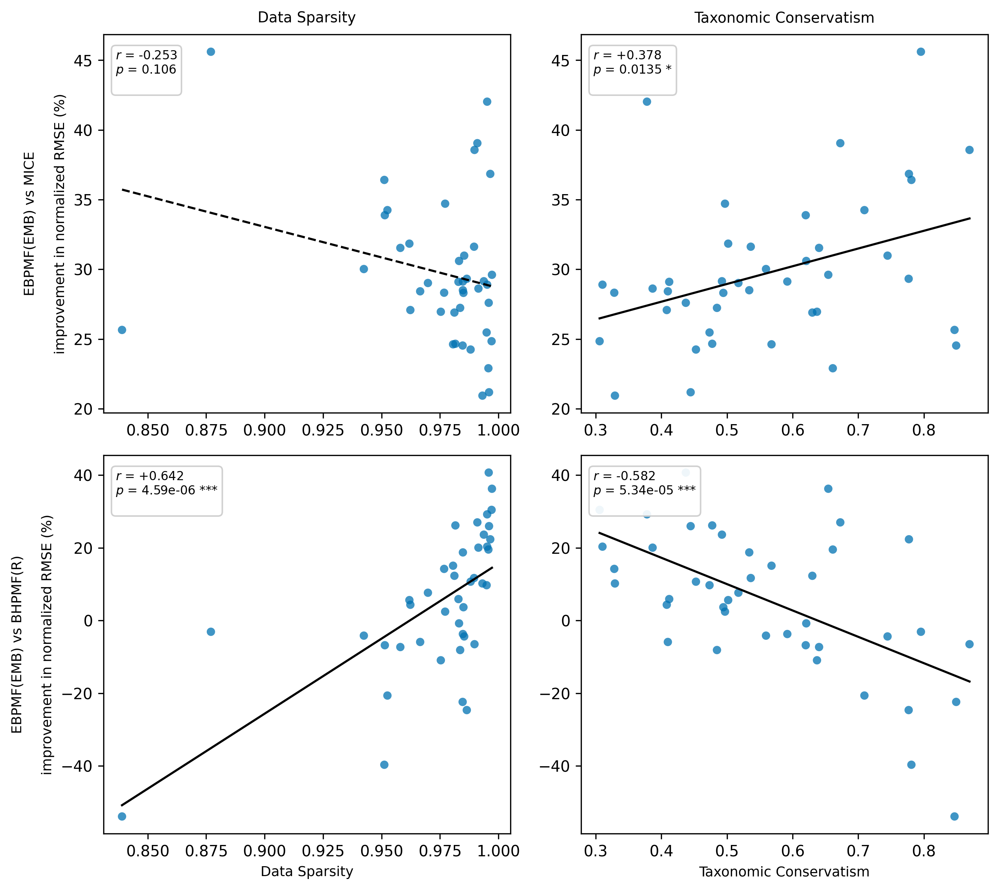

In [18]:
# =============================================================================
# Figure 4 (RQ2 / H2)
#
# Four prespecified Pearson correlations:
#   1. sparsity × improvement over MICE
#   2. taxonomic conservatism × improvement over MICE
#   3. sparsity × improvement over BHPMF(R)
#   4. taxonomic conservatism × improvement over BHPMF(R)
#
# Each relationship is tested separately using Pearson correlation.
# No partial correlation or multiple regression is used.
# =============================================================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

PREDICTORS = ['sparsity', 'tax_signal']

# Trait-level sparsity
sparsity = pd.DataFrame({
    'name': list(names),
    'sparsity': np.isnan(trait_matrix).mean(axis=0)
})

# Trait-level explanatory variables
design_rq2 = sparsity.merge(
    tax_df[['name', 'tax_signal']],
    on='name',
    how='inner'
)


def improvement(base_df, emb_df):
    """
    Relative reduction in normalized RMSE of EBPMF(EMB)
    compared with the selected benchmark.

    Positive values favour EBPMF(EMB).
    """
    d = base_df[['name', 'mse_norm']].merge(
        emb_df[['name', 'mse_norm']],
        on='name',
        suffixes=('_base', '_emb')
    )

    d['improve'] = (
        (d['mse_norm_base'] - d['mse_norm_emb'])
        / d['mse_norm_base']
        * 100
    )

    return d[['name', 'improve']]


def pearson_analysis(base_df, predictor):
    """
    Calculate the ordinary Pearson correlation between one
    trait-level predictor and EMB improvement.
    """
    d = design_rq2.merge(
        improvement(base_df, emb_df),
        on='name',
        how='inner'
    )

    d = (
        d[['name', predictor, 'improve']]
        .replace([np.inf, -np.inf], np.nan)
        .dropna()
    )

    if len(d) < 3:
        raise ValueError(
            f"Too few complete observations for {predictor}: n={len(d)}"
        )

    x = d[predictor].to_numpy(dtype=float)
    y = d['improve'].to_numpy(dtype=float)

    r, p = pearsonr(x, y)

    return {
        'data': d,
        'r': float(r),
        'p': float(p),
        'n': int(len(d))
    }


RESULTS_RQ2 = {
    ('MICE', 'sparsity'):
        pearson_analysis(mice_df, 'sparsity'),

    ('MICE', 'tax_signal'):
        pearson_analysis(mice_df, 'tax_signal'),

    ('BHPMF(R)', 'sparsity'):
        pearson_analysis(bhpmfr_df, 'sparsity'),

    ('BHPMF(R)', 'tax_signal'):
        pearson_analysis(bhpmfr_df, 'tax_signal'),
}


EXPECT = {
    ('sparsity', 'MICE'): 'none',
    ('sparsity', 'BHPMF(R)'): '+',
    ('tax_signal', 'MICE'): '+',
    ('tax_signal', 'BHPMF(R)'): '-',
}


XLAB = {
    'sparsity':
        'Data Sparsity',

    'tax_signal':
        'Taxonomic Conservatism',
}


fig, axes = plt.subplots(
    2,
    2,
    figsize=(9.2, 8.2),
    dpi=300
)

for row, benchmark in enumerate(['MICE', 'BHPMF(R)']):
    for col, predictor in enumerate(PREDICTORS):

        ax = axes[row, col]
        result = RESULTS_RQ2[(benchmark, predictor)]
        d = result['data']

        x = d[predictor].to_numpy(dtype=float)
        y = d['improve'].to_numpy(dtype=float)

        # Trait-level observations
        ax.scatter(
            x,
            y,
            s=30,
            alpha=0.75,
            edgecolor='none',
            color='#0072B2'
        )

        # Least-squares line for visualization only
        if np.ptp(x) > 0:
            slope, intercept = np.polyfit(x, y, 1)
            xs = np.linspace(x.min(), x.max(), 100)
            line_style = '--' if result['p'] > 0.05 else '-'

            ax.plot(
                xs,
                intercept + slope * xs,
                color='black',
                lw=1.4,
                linestyle=line_style
            )

        r = result['r']
        p = result['p']
        n = result['n']

        if p < 0.001:
            star = '***'
        elif p < 0.01:
            star = '**'
        elif p < 0.05:
            star = '*'
        else:
            star = ''

        ax.text(
            0.03,
            0.96,
            (
                f"$r$ = {r:+.3f}\n"
                f"$p$ = {p:.3g} {star}\n"
            ),
            transform=ax.transAxes,
            va='top',
            fontsize=8,
            bbox=dict(
                boxstyle='round,pad=.35',
                fc='white',
                ec='.8',
                alpha=.92
            )
        )



        if row == 1:
            ax.set_xlabel(
                XLAB[predictor],
                fontsize=9
            )

        if col == 0:
            ax.set_ylabel(
                f'EBPMF(EMB) vs {benchmark}\n\n'
                'improvement in normalized RMSE (%)',
                fontsize=9
            )

        if row == 0:
            ax.set_title(
                XLAB[predictor],
                fontsize=9.5,
                pad=8
            )


plt.tight_layout()
plt.show()

## RQ3 — export the network input used by the R analysis


In [19]:
# =============================================================================
# Export both network bases for create_networks_v5_dual.R
#
# One workbook per model, one sheet per basis. R builds G = P %*% t(P) from
# whichever sheet it is pointed at, so the two routes differ in the PROFILE
# MATRIX only -- same raw Gram, same Louvain(|G|), same sign restoration, same
# top-k. Any difference in the R output is therefore attributable to the metric
# and to nothing else. That is cell 24's A vs C contrast, handed to R.
#
#   basis_VV : P = V        (42 x n_latent)   metric I      Marco, Teams 2:43
#   basis_VW : P = V @ W    (42 x n_pred)     metric W W'   Peter #246 / #247
#
# NOTE the sign. The 'influence' sheet in latent_matrices_{model}.xlsx holds
# |V@W|, which is what Figure 5 plots. It must NOT be used here: Marco is
# explicit that "Negative weights have meaning", and taking |.| before the Gram
# destroys exactly the opposing-direction edges his method restores afterwards.
# basis_VW is the SIGNED product.
# =============================================================================

import hashlib
import datetime
import numpy as np
from openpyxl import Workbook
from openpyxl.styles import Font


def export_network_bases(V, W, names, model, output_dir='outputs'):
    V = np.asarray(V, float)
    W = np.asarray(W, float)
    names = list(names)

    if V.shape[1] != W.shape[0]:
        raise ValueError(f"latent dim mismatch: V has {V.shape[1]}, W has {W.shape[0]}")
    if len(names) != V.shape[0]:
        raise ValueError(f"{len(names)} names for {V.shape[0]} rows of V")

    P = V @ W                                    # SIGNED, not |V@W|

    bases = {
        'basis_VV': (V, [f'latent_{i}' for i in range(V.shape[1])],
                     "P = V. Latent metric I. Marco, Teams 2:43 'use the Gram matrix directly'."),
        'basis_VW': (P, [f'pred_{i}' for i in range(P.shape[1])],
                     "P = V @ W, signed. Latent metric W W'. Peter #246/#247, "
                     "'the direct weights of fig5'. This is the Figure 5 matrix before |.|."),
    }

    path = f'{output_dir}/network_input_{model}.xlsx'
    wb = Workbook()

    ws = wb.active
    ws.title = 'README'
    meta = [
        ('field', 'value'),
        ('model', model),
        ('n_traits', V.shape[0]),
        ('n_latent', V.shape[1]),
        ('n_predictors', W.shape[1]),
        ('written', datetime.datetime.now().isoformat(timespec='seconds')),
        ('md5_V', hashlib.md5(np.ascontiguousarray(V).tobytes()).hexdigest()),
        ('md5_W', hashlib.md5(np.ascontiguousarray(W).tobytes()).hexdigest()),
        ('', ''),
        ('basis_VV', bases['basis_VV'][2]),
        ('basis_VW', bases['basis_VW'][2]),
        ('', ''),
        ('algebra', "(V W)(V W)' = V (W W') V'   vs   V V' = V (I) V'"),
        ('consequence', "choosing VV over VW asserts W W' proportional to I; cell 24 tests that"),
        ('sign', "basis_VW is SIGNED. |V@W| is the Figure 5 display matrix and is not used here."),
    ]
    for r in meta:
        ws.append(list(r))
    for c in ws[1]:
        c.font = Font(bold=True)
    ws.column_dimensions['A'].width = 16
    ws.column_dimensions['B'].width = 95

    for sheet, (M, cols, desc) in bases.items():
        ws = wb.create_sheet(sheet)
        ws.append(['trait'] + cols)
        for c in ws[1]:
            c.font = Font(bold=True)
        for nm, row in zip(names, M):
            ws.append([nm] + [float(x) for x in row])
        ws.freeze_panes = 'B2'
        ws.column_dimensions['A'].width = 26

    wb.save(path)
    print(f"  {path}")
    for sheet, (M, _, _) in bases.items():
        print(f"    {sheet:9s} {M.shape[0]:3d} x {M.shape[1]:3d}   "
              f"|.|max = {np.abs(M).max():.4g}")
    return path


print("export for create_networks.R")
export_network_bases(V_emb, W_emb, names, 'emb')
print("\nnow run create_networks.R (MODEL <- 'emb'), then the two readout cells.")


export for create_networks.R
  outputs/network_input_emb.xlsx
    basis_VV   42 x  24   |.|max = 0.01015
    basis_VW   42 x  48   |.|max = 0.1046

now run create_networks.R (MODEL <- 'emb'), then the two readout cells.


## RQ3 — betweenness analysis retained in the main text


In [20]:
# =============================================================================
# Export one latent-matrix workbook per model, for create_networks.R
# =============================================================================

import hashlib
import datetime
from openpyxl import Workbook
from openpyxl.styles import Font, PatternFill, Alignment

EXPECTED_N_PRED = {'emb': N_EMB_PCS, 'flora': len(flora_feat_cols)}


def build_excel_for_r(W, V, names, predictor_names, model, output_dir='outputs'):
    """Write W, V, |V@W|, Gram and Cosine matrices to outputs/latent_matrices_{model}.xlsx.

    model : {'emb', 'flora'} -- validated against W.shape[1] so the 0706 swap
                                (flora arrays exported under the emb name) raises.
    """
    if model not in EXPECTED_N_PRED:
        raise ValueError(f"model must be one of {list(EXPECTED_N_PRED)}, got {model!r}")

    V = np.asarray(V, dtype=float)
    W = np.asarray(W, dtype=float)
    names = list(names)
    predictor_names = list(predictor_names)

    n_traits, n_latent = V.shape
    n_lat_w, n_pred = W.shape

    if n_latent != n_lat_w:
        raise ValueError(f"latent dim mismatch: V has {n_latent}, W has {n_lat_w}")
    if len(names) != n_traits:
        raise ValueError(f"{len(names)} trait names for {n_traits} rows of V")
    if len(predictor_names) != n_pred:
        raise ValueError(f"{len(predictor_names)} predictor names for {n_pred} columns of W")
    if n_pred != EXPECTED_N_PRED[model]:
        raise ValueError(
            f"model='{model}' expects {EXPECTED_N_PRED[model]} predictors but W has "
            f"{n_pred} columns. {N_EMB_PCS} -> embedding PCs, {len(flora_feat_cols)} -> "
            f"flora traits. Check which array you passed.")

    influence = np.abs(V @ W)
    gram = V @ V.T
    unit = V / np.linalg.norm(V, axis=1, keepdims=True)
    cosine = unit @ unit.T

    lat_cols = [f'latent_{i}' for i in range(n_latent)]
    md5_V = hashlib.md5(np.ascontiguousarray(V).tobytes()).hexdigest()
    md5_W = hashlib.md5(np.ascontiguousarray(W).tobytes()).hexdigest()

    output_path = f'{output_dir}/latent_matrices_{model}.xlsx'
    wb = Workbook()

    ws = wb.active
    ws.title = 'README'
    for row in [
        ('field', 'value'),
        ('model', model),
        ('model_description',
         f'EBPMF_emb: species prior = {N_EMB_PCS} embedding PCs' if model == 'emb'
         else f'EBPMF_flora: species prior = {len(flora_feat_cols)} flora-derived traits'),
        ('n_traits', n_traits),
        ('n_latent', n_latent),
        ('n_predictors', n_pred),
        ('md5_V', md5_V),
        ('md5_W', md5_W),
        ('exported', datetime.datetime.now().isoformat(timespec='seconds')),
        ('', ''),
        ('NOTE', "Build the trait network from 'Cosine VVt', not 'Gram VVt'. In the raw "
                 "Gram matrix node strength is dominated by ||v_i|| (r = 0.84 emb, 0.90 "
                 "flora), so strength largely restates how much latent signal the model "
                 "assigns to a trait. Cosine removes this (r = 0.09 emb)."),
        ('NOTE', "The 0706 export wrote the flora model under both names. Always check "
                 "n_predictors: 48 = embedding, 28 = flora."),
    ]:
        ws.append(list(row))
    ws.column_dimensions['A'].width = 20
    ws.column_dimensions['B'].width = 110
    for c in ws['B']:
        c.alignment = Alignment(wrap_text=True, vertical='top')

    ws_w = wb.create_sheet('W_projection (latent×pred)')
    ws_w.append(['latent_dim'] + predictor_names)
    for i in range(n_latent):
        ws_w.append([lat_cols[i]] + W[i].tolist())

    ws_v = wb.create_sheet('V_trait_factors (trait×latent)')
    ws_v.append(['trait_name'] + lat_cols)
    for i, nm in enumerate(names):
        ws_v.append([nm] + V[i].tolist())

    ws_inf = wb.create_sheet('|V@W| influence (trait×pred)')
    ws_inf.append(['trait_name'] + predictor_names)
    for i, nm in enumerate(names):
        ws_inf.append([nm] + influence[i].tolist())

    ws_g = wb.create_sheet('Gram VVt (trait×trait)')
    ws_g.append(['trait_name'] + names)
    for i, nm in enumerate(names):
        ws_g.append([nm] + gram[i].tolist())

    ws_c = wb.create_sheet('Cosine VVt (trait×trait)')
    ws_c.append(['trait_name'] + names)
    for i, nm in enumerate(names):
        ws_c.append([nm] + cosine[i].tolist())

    header_font = Font(bold=True)
    header_fill = PatternFill('solid', fgColor='D9E2F3')
    for sheet in [ws_w, ws_v, ws_inf, ws_g, ws_c]:
        for cell in sheet[1]:
            cell.font = header_font
            cell.fill = header_fill
            cell.alignment = Alignment(horizontal='center')
        sheet.column_dimensions['A'].width = 28
        sheet.freeze_panes = 'B2'
    for cell in ws['1:1']:
        cell.font = header_font
        cell.fill = header_fill

    wb.save(output_path)
    print(f'Saved: {output_path}   [{model}: {n_traits} traits x {n_latent} latent x '
          f'{n_pred} predictors]  md5(V)={md5_V[:8]} md5(W)={md5_W[:8]}')
    return output_path


# embedding PC labels, and the real flora trait names from the master table
emb_pc_names = [f'PC_{i}' for i in range(N_EMB_PCS)]

path_emb   = build_excel_for_r(W_emb,   V_emb,   list(names), emb_pc_names,     model='emb')




Saved: outputs/latent_matrices_emb.xlsx   [emb: 42 traits x 24 latent x 48 predictors]  md5(V)=39018bfa md5(W)=7bd39fc7


Then, run the create_networks.R with the output generated by above cell.

Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


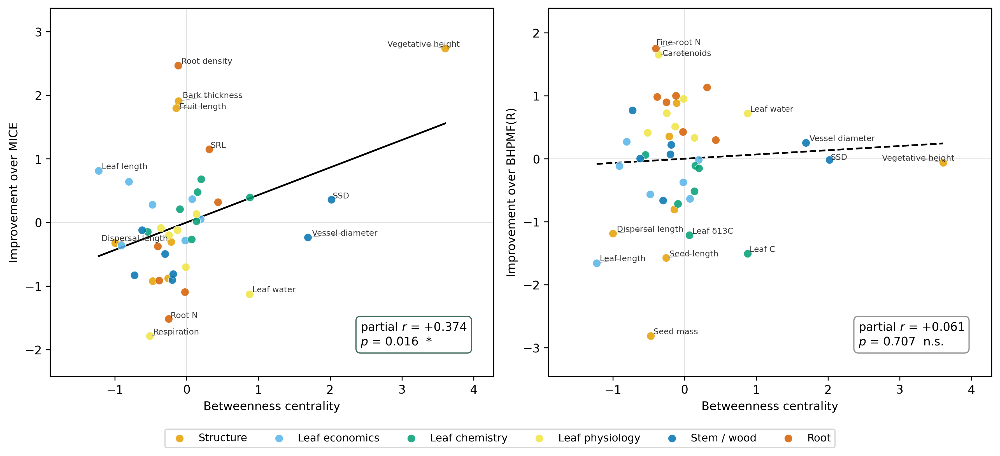

In [21]:
# =============================================================================
# Text Diagram: betweenness × MICE / BHPMF(R), basis VW, emb  based on modules produced in R
# Only control ‖P_j‖
# =============================================================================

import numpy as np
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
from adjustText import adjust_text          # pip install adjustText

MODEL = 'emb'
OUT   = 'outputs'
BASIS = 'VW'
BASELINES = [('MICE', mice_df), ('BHPMF(R)', bhpmfr_df)]
idx = list(names)
n   = len(idx)

nodes = pd.read_csv(f'{OUT}/network_nodes_gram_{MODEL}_{BASIS}.csv')
nodes = nodes.set_index('trait').loc[idx].reset_index()

e_v = emb_df.set_index('name').loc[idx, 'mse_norm'].values
IMP = {}
for bn, bdf in BASELINES:
    b_v = bdf.set_index('name').loc[idx, 'mse_norm'].values
    IMP[bn] = (b_v - e_v) / b_v * 100.0

own = nodes['own_norm'].values.astype(float)

domains = (['Structure'] * 7 + ['Leaf economics'] * 7 + ['Leaf chemistry'] * 7 +
           ['Leaf physiology'] * 7 + ['Stem / wood'] * 7 + ['Root'] * 7)
DOM_COL = {'Structure': '#E69F00', 'Leaf economics': '#56B4E9',
           'Leaf chemistry': '#009E73', 'Leaf physiology': '#F0E442',
           'Stem / wood': '#0072B2', 'Root': '#D55E00'}
colors = [DOM_COL[d] for d in domains]


def _z(a):
    a = np.asarray(a, float)
    return (a - a.mean()) / a.std(ddof=1)


def _partial(yv, xv, ctrl):
    C = _z(ctrl).reshape(-1, 1)
    X = np.column_stack([_z(xv), C])
    ok = np.isfinite(X).all(1) & np.isfinite(yv)
    m = sm.OLS(_z(yv)[ok], sm.add_constant(X[ok])).fit()
    t = m.tvalues[1]
    pr = t / np.sqrt(t ** 2 + m.df_resid)
    Z = sm.add_constant(C[ok])
    rx = sm.OLS(_z(xv)[ok], Z).fit().resid
    ry = sm.OLS(_z(yv)[ok], Z).fit().resid
    return pr, m.pvalues[1], rx, ry


# =========================================================================
# 图 1  正文: betweenness × 2 baselines, domain 着色, 标注性状名
# =========================================================================

fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), dpi=300)
trait_names = nodes['trait'].values

for c, (bn, _) in enumerate(BASELINES):
    ax = axes[c]
    x = nodes['betweenness'].values.astype(float)
    pr, pp, rx, ry = _partial(IMP[bn], x, own)

    for d in DOM_COL:
        mask = np.array([dd == d for dd in domains])
        ax.scatter(rx[mask], ry[mask], s=48, alpha=.85, edgecolor='white',
                   linewidth=.4, color=DOM_COL[d], label=d, zorder=3)

    # 只标最外围的点：其余靠颜色图例辨认
    score = np.hypot(rx / rx.std(ddof=1), ry / ry.std(ddof=1))
    show  = np.argsort(-score)[:12]
    texts = [ax.text(rx[i], ry[i], trait_names[i], fontsize=7, color='.2')
             for i in show]
    adjust_text(texts, x=rx, y=ry, ax=ax,
                expand_points=(1.5, 1.5), force_text=(.4, .6),
                arrowprops=dict(arrowstyle='-', color='.65', lw=.5))

    ax.margins(0.14) 

    k = np.polyfit(rx, ry, 1)
    xs = np.linspace(rx.min(), rx.max(), 50)

    line_style = '--' if pp > 0.05 else '-'

    ax.plot(
        xs,
        np.polyval(k, xs),
        color='black',
        lw=1.5,
        linestyle=line_style,
        zorder=2
    )
    ax.axhline(0, color='.88', lw=.7, zorder=0)
    ax.axvline(0, color='.88', lw=.7, zorder=0)

    sig = pp < .05
    col = '#2E5E4E' if sig else '#8A8A8A'
    star = '**' if pp < .01 else '*' if pp < .05 else 'n.s.'
    ax.text(.70, .15,
            f"partial $r$ = {pr:+.3f}\n$p$ = {pp:.3g}  {star}",
            transform=ax.transAxes, va='top', fontsize=10,
            bbox=dict(boxstyle='round,pad=.4', fc='white', ec=col, alpha=.93))

    ax.set_xlabel('Betweenness centrality', fontsize=10)
    ax.set_ylabel(f'Improvement over {bn}', fontsize=10)
    #ax.set_title(f'{bn}', fontsize=13, pad=10)

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', ncol=6, fontsize=9,
           frameon=True, edgecolor='.8', bbox_to_anchor=(.5, -0.02))

plt.tight_layout(rect=[0, 0.04, 1, .97])
plt.savefig(f'{OUT}/fig_rq3_betweenness_main_{MODEL}.pdf', bbox_inches='tight')
plt.show()




In [22]:
from adjustText import adjust_text          # pip install adjustText

for c, (bn, _) in enumerate(BASELINES):
    ax = axes[c]
    x = nodes['betweenness'].values.astype(float)
    pr, pp, rx, ry = _partial(IMP[bn], x, own)

    for d in DOM_COL:
        mask = np.array([dd == d for dd in domains])
        ax.scatter(rx[mask], ry[mask], s=48, alpha=.85, edgecolor='white',
                   linewidth=.4, color=DOM_COL[d], label=d, zorder=3)

    # 只标最外围的点：其余靠颜色图例辨认
    score = np.hypot(rx / rx.std(ddof=1), ry / ry.std(ddof=1))
    show  = np.argsort(-score)[:12]
    texts = [ax.text(rx[i], ry[i], trait_names[i], fontsize=7, color='.2')
             for i in show]
    adjust_text(texts, x=rx, y=ry, ax=ax,
                expand_points=(1.5, 1.5), force_text=(.4, .6),
                arrowprops=dict(arrowstyle='-', color='.65', lw=.5))

    ax.margins(0.14)                        # 关键：给标签留白，不再溢出
    ...

In [23]:
# =============================================================================

# RQ3: Q, permutation null, ARI — based on modules produced in R
# create_networks.R has already performed Louvain clustering and
# written the assignments to the community column.
# This script only reads those assignments and then calculates the statistics
# and null models.
# =============================================================================

import numpy as np
import pandas as pd
import networkx as nx
from sklearn.metrics import adjusted_rand_score
from collections import Counter

MODEL    = 'emb'
BASIS    = 'VW'
OUT      = 'outputs'
N_PERM_Q = 1000
N_PERM_A = 10000
SEED     = 42

idx = list(names)
n   = len(idx)
domains = (['Structure'] * 7 + ['Leaf economics'] * 7 + ['Leaf chemistry'] * 7 +
           ['Leaf physiology'] * 7 + ['Stem / wood'] * 7 + ['Root'] * 7)

# ---- profile matrix (same as the matrix passed to R) -----------------------
if BASIS == 'VV':
    P = np.asarray(V_emb, float)
else:
    P = np.asarray(V_emb, float) @ np.asarray(W_emb, float)


def signed_gram(P):
    G = P @ P.T
    np.fill_diagonal(G, 0.0)
    return G


# ---- read module assignments produced in R ---------------------------------
nodes_r = pd.read_csv(f'{OUT}/network_nodes_gram_{MODEL}_{BASIS}.csv')
nodes_r = nodes_r.set_index('trait').loc[idx].reset_index()
labels_obs = nodes_r['community'].values.astype(int)
k_obs = len(set(labels_obs))

# ---- calculate Q on the full |G| rather than the top-k graph ---------------
# Calculating Q on the full graph is more conservative than calculating it on
# the top-k graph, because statistical significance is harder to achieve.
# It therefore provides a cleaner test.
G_signed = signed_gram(P)
G_abs = np.abs(G_signed)
G_nx = nx.from_numpy_array(G_abs)

comms_obs = [{i for i in range(n) if labels_obs[i] == ci}
             for ci in sorted(set(labels_obs))]
#Q_obs = nx.community.modularity(G_nx, comms_obs, weight='weight')

# ---- ARI versus domain ------------------------------------------------------
ari_obs = adjusted_rand_score(labels_obs, domains)

# ---- Q null: profile permutation -------------------------------------------
# Permute the trait-to-profile correspondence while preserving the overall
# scale of the Gram matrix.
# For each permutation, reconstruct G and evaluate the number of modules
# identified in R without rerunning Louvain.
# Correction: the null model must recluster the permuted graph; otherwise,
# it does not test the presence of modular structure.
rng = np.random.default_rng(SEED)

'''
def louvain_labels(G_nx, seed):
    comms = nx.community.louvain_communities(G_nx, weight='weight', seed=seed)
    labs = np.zeros(G_nx.number_of_nodes(), int)
    for ci, members in enumerate(comms):
        for m in members:
            labs[m] = ci
    return labs


print(f"running {N_PERM_Q} profile permutations for Q null ...")
Q_null = []
for _ in range(N_PERM_Q):
    perm = rng.permutation(n)
    P_perm = P[perm]
    G_perm = np.abs(signed_gram(P_perm))
    G_perm_nx = nx.from_numpy_array(G_perm)
    labs_perm = louvain_labels(G_perm_nx, seed=int(rng.integers(1 << 31)))
    comms_perm = [{i for i in range(n) if labs_perm[i] == ci}
                  for ci in sorted(set(labs_perm))]
    Q_null.append(nx.community.modularity(G_perm_nx, comms_perm, weight='weight'))
Q_null = np.array(Q_null)
p_Q = float((Q_null >= Q_obs).sum() + 1) / (N_PERM_Q + 1)'''

# ---- ARI null: label permutation -------------------------------------------
print(f"running {N_PERM_A} label permutations for ARI null ...")
dom_arr = np.array(domains)
ari_null = np.array([adjusted_rand_score(labels_obs, rng.permutation(dom_arr))
                     for _ in range(N_PERM_A)])
p_ARI = float((ari_null >= ari_obs).sum() + 1) / (N_PERM_A + 1)

# ---- report ----------------------------------------------------------------
print('=' * 72)
print(f"basis {BASIS}   modules from R (create_networks_v5_dual.R)")
print(f"Q evaluated on the FULL |G|, not the top-k display graph")
print('=' * 72)

print(f"\nmodules k = {k_obs}")
for ci in sorted(set(labels_obs)):
    members = [idx[i] for i in range(n) if labels_obs[i] == ci]
    dom_counts = Counter(domains[i] for i in range(n) if labels_obs[i] == ci)
    print(f"  module {ci}  n={len(members):2d}  "
          + ', '.join(f'{d}({c})' for d, c in dom_counts.most_common()))
    print(f"    traits: {', '.join(members)}")

#print(f"\nQ = {Q_obs:.3f}")
#print(f"  profile-permutation null: mean = {Q_null.mean():.3f}  "
#      f"95% CI = [{np.percentile(Q_null, 2.5):.3f}, "
#      f"{np.percentile(Q_null, 97.5):.3f}]")
#print(f"  p = {p_Q:.4f}")

print(f"\nARI vs domain = {ari_obs:.3f}")
print(f"  label-permutation null: mean = {np.mean(ari_null):.4f}")
print(f"  p = {p_ARI:.5f}")

running 10000 label permutations for ARI null ...
basis VW   modules from R (create_networks_v5_dual.R)
Q evaluated on the FULL |G|, not the top-k display graph

modules k = 4
  module 1  n=12  Structure(6), Root(5), Stem / wood(1)
    traits: Vegetative height, Seed length, Bark thickness, Stem diameter, Seed mass, Dispersal length, Vessel diameter, Root depth, Fine-root SRL, Fine-root diameter, Fine-root N, SRL
  module 2  n= 8  Stem / wood(4), Leaf physiology(2), Structure(1), Leaf chemistry(1)
    traits: Fruit length, Leaf δ15N, Leaf Transpiration, Vcmax, Conduit density, Vessel density, Conduit area, Fibre fraction
  module 3  n=16  Leaf chemistry(5), Leaf physiology(5), Leaf economics(3), Root(2), Stem / wood(1)
    traits: SLA, LDMC, Leaf density, Leaf N, Leaf K, Leaf P, Leaf C, Leaf Ca, Leaf water, Chlorophyll, Respiration, Carotenoids, Photosynthesis, SSD, Root density, Root N
  module 4  n= 6  Leaf economics(4), Leaf chemistry(1), Stem / wood(1)
    traits: Leaf fresh mass, 